In [6]:
library('hdp')
library('clusterCrit')
library('grid')
library('gridExtra')
library('ggplot2')
library('ggrepel')
library('RColorBrewer')
library('dplyr')
library('reshape2')
library('IRdisplay')
source('../../../src/tools.R')     # custom tools function
#source('../../../src/hdp_tools.R') # hdp related functions
source('../../../src/hdp_tools_yanis.R')
library(scales)
theme_set(theme_minimal())

# set jupyer notebook parameters
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 200, # set the maximum number of rows displayed
        repr.matrix.max.cols = 200) # set the maximum number of columns displayed


In [3]:
df_final <- read.table("../../../data/updated_dataset/modif_final.csv",sep = ',' , header = T)
rownames(df_final)<- df_final$data_pd
df_final <- df_final[,-1:-3]
dd_predicted_10_components <- read.table("dd_predicted_10_components.tsv",sep = '\t' , header = T)

In [4]:
dim(df_final)

[1] 2150  151

##### The inital dataset has been slightly modified with predefined rules that we have agreed on with Elli.
##### This notebook is the result of different gridsearch in order to optimise our HDP Clustering. 
##### In the gridsearch applied, the main parameter that we have played with is the base distribution. It seems that the most coherent base distribution to use for the HDP is a univariate gaussian 
##### representing the distribution for each feature that we will train the HDP with.
##### The others parameters that we have played wioth are: number of chains, number of initial clusters, posterior samples, space as well as alphaa and alphab which are the tuning parameters .

# Useful functions to use

#### I) This function launches the hdp with the parameters that we will have deduced from the plot results

In [5]:
launch <- function(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab){
    number_of_chains <- chains
    chain_list <- vector('list', number_of_chains)
    hdp <- initialise_hdp_yanis(data = data,hh=base_dist,alphaa = aa,alphab= ab)


    for (i in 1:number_of_chains) {
        seed <- i * 100
        print_and_flush(sprintf('### Experiment %d (seed = %d) ###\n', i, seed))

        # run single hdp chain
        chain_list[[i]] <- activate_and_run_hdp(hdp,
                                                initcc = initial_clusters,
                                                burnin = burn,
                                                n      = posterior_samples,
                                                space  = 20,
                                                seed   = seed)
        print_and_flush('\n')
    }

    multi_output <- hdp_multi_chain(chain_list)
    print(multi_output)
}

#### II) This function prepares the distribution to use for the hdp based on the dataframe that we will use

In [6]:
prepare_dist <- function(df_final){
    num_cols = ncol(df_final)
    bin <- function(x){
        set.seed(123)
      (rbinom(1, num_cols, mean(x))+1)/num_cols
    }

    ###Normal

    normal <- function(x){
        set.seed(123)
      abs(rnorm(1,mean(x),sd(x)))
    }

    ###Poisson

    poisson <- function(x){
        set.seed(123)
      (rpois(num_cols,1))/num_cols
    }

    ###Uniform equally over all columns

    equally <- function(x){
        set.seed(123)
      1/num_cols
    }

    ###Repet 1

    repet <- function(x){
        set.seed(123)
      1
    }

    binomial <- unlist(sapply(df_final,bin))
    gaussian <- unlist(sapply(df_final,normal))
    pois <- as.numeric(unlist(sapply(df_final,poisson)))
    unif <- unlist(sapply(df_final,equally))
    repetition <- unlist(sapply(df_final,repet))
    lists<- list(binomial,gaussian,unif,repetition)
    lists
}

# HDP NEW GRIDSEARCH OPTIMIZED

In [218]:
new_table <- read.table("gridsearch.tsv",sep = '\t' , header = T)
new_table[new_table$n_components>=8,][order(new_table[new_table$n_components>=8,]$n_components,decreasing=T),]

,chains,inicc,n,burnin,space,base_dist,alphaa,alphab,n_components,component_0,assignment,Davies_Bouldin,Silhouette
17,3,15,250,7000,20,binomial,1,1.0,10,141,1705,3.651149,0.04891112
19,3,15,300,7000,20,binomial,1,1.0,10,145,1702,3.640422,0.04921236
21,3,15,400,7000,20,binomial,1,1.0,10,145,1696,3.636254,0.04935150
23,3,15,450,7000,20,binomial,1,1.0,10,145,1697,3.637126,0.04952929
25,3,17,250,7000,20,binomial,1,1.0,10,75,1756,3.587506,0.06830226
142,3,17,150,7000,20,gaussian,2,0.5,10,31,1755,3.235181,0.05041651
162,3,17,200,7000,20,gaussian,2,0.5,10,30,1761,3.260393,0.04901676
182,3,17,250,7000,20,gaussian,2,0.5,10,25,1754,3.291908,0.04637225
83,3,17,350,7000,20,binomial,1,1.0,10,70,1752,3.575666,0.06851096
74,5,21,400,7000,20,binomial,2,0.5,10,173,1686,3.728565,0.06283996


In [169]:
print("assignment:")
summary(new_table$assignment)
print("Davies_Bouldin: ")
summary(new_table$Davies_Bouldin)
print("new_table: ")
summary(new_table$component_0)

[1] "assignment:"


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1686    1758    1771    1776    1787    1942 

[1] "Davies_Bouldin: "


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.096   3.434   3.603   3.566   3.703   3.905 

[1] "new_table: "


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0    57.5    84.0   117.7   125.0   594.0 

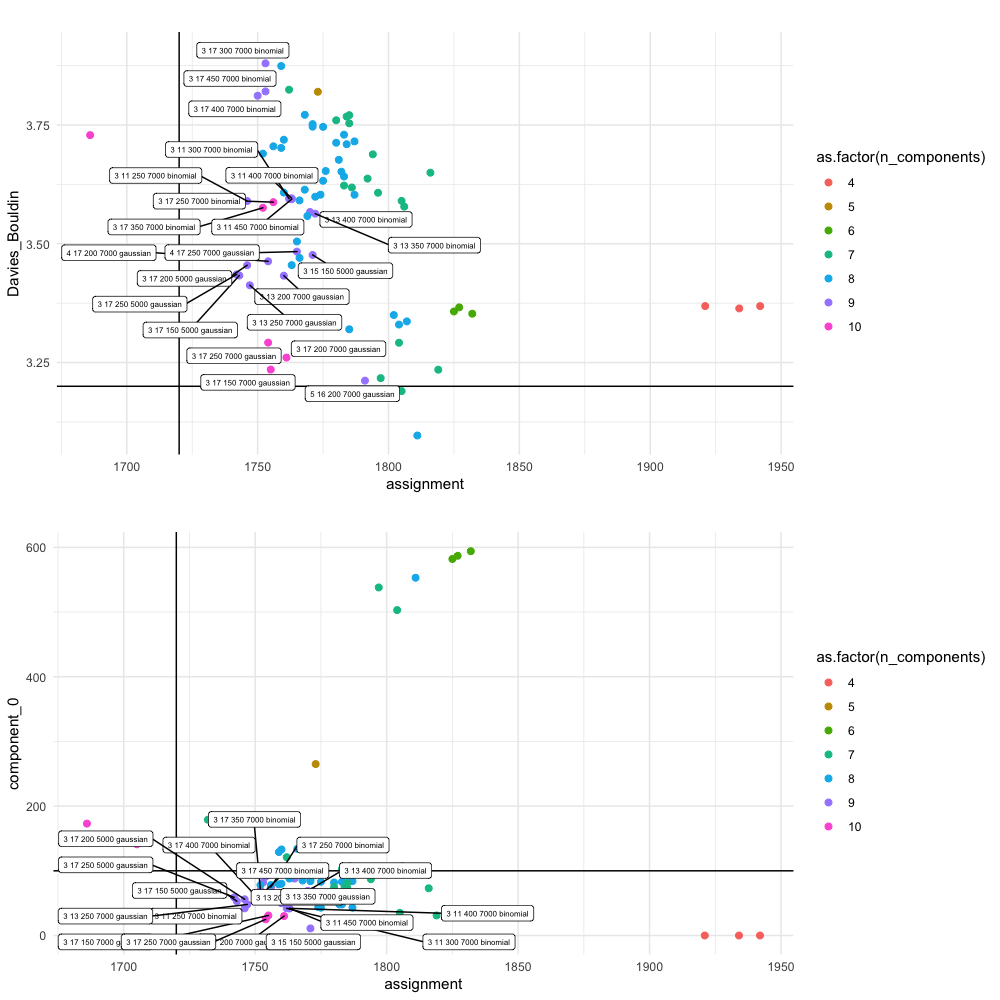

In [196]:


set_notebook_plot_size(10, 10)


new_table_S_DB <- new_table[new_table$assignment > 1740 & new_table$Davies_Bouldin > 3.2,]
new_table_S_DB$good <- ifelse(new_table_S_DB$n_components>=9 & new_table_S_DB$assignment > 1740 & new_table_S_DB$Davies_Bouldin > 3.2, paste(new_table_S_DB$chains,new_table_S_DB$inicc,new_table_S_DB$n,new_table_S_DB$burnin,new_table_S_DB$base_dist),'')

new_table_A_0 <- new_table[new_table$assignment > 1740 & new_table$component_0 < 80,]
new_table_A_0$good <- ifelse(new_table_A_0$n_components>=9 & new_table_A_0$assignment > 1740 & new_table_A_0$component_0 < 80, paste(new_table_A_0$chains,new_table_A_0$inicc,new_table_A_0$n,new_table_A_0$burnin,new_table_S_DB$base_dist),'')

g1 <- ggplot(new_table) +
        geom_point(aes(x = assignment, y = Davies_Bouldin, col = as.factor(n_components)), size = 2) +
        ggtitle('') +
        geom_hline(yintercept = 3.2) + #we want higher than 3rd quart
        geom_vline(xintercept = 1720) + #we want higher than 3rd quart
        geom_label_repel(aes(x = assignment, y = Davies_Bouldin, label=good), size=2, data=new_table_S_DB)

g2 <- ggplot(new_table) +
        geom_point(aes(x = assignment, y = component_0, col = as.factor(n_components)), size = 2) +
        ggtitle('') +
        geom_hline(yintercept = 100) + #we want lower than 1st quart
        geom_vline(xintercept = 1720) + #we want higher than 3rd quart
        geom_label_repel(aes(x = assignment, y = component_0, label=good), size=2, data=new_table_A_0)

grid.arrange(g1, g2, ncol = 1)

# I- ANALYSIS WITH 10 COMPONENTS

In [200]:
data <- df_final
posterior_samples <- 250
initial_clusters <- 17
burn <- 7000
chains <- 3
base_dist <- gaussian
aa <- 2
ab <-0.5

Initialise HDP on a 2150 x 151 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 750 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 2151 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of 

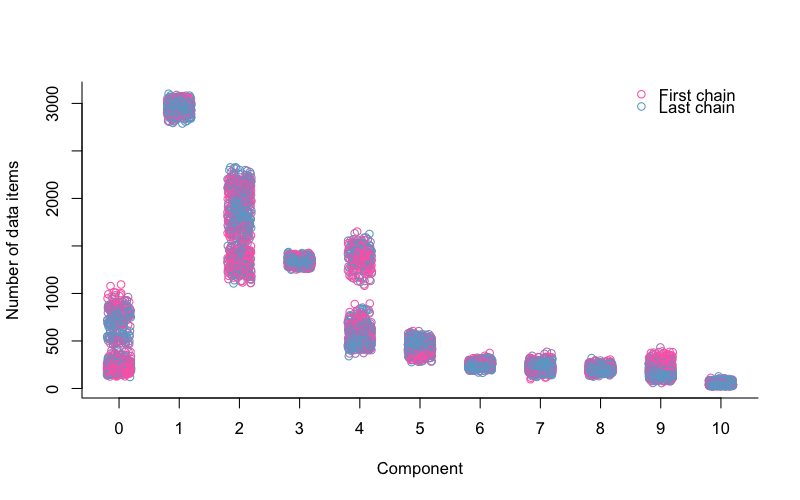

In [201]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_cluster_10 <- extract_components(multi_output)
plot_components_size(multi_output_cluster_10)

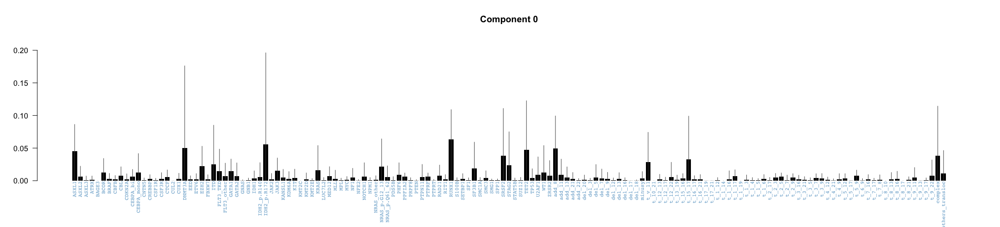

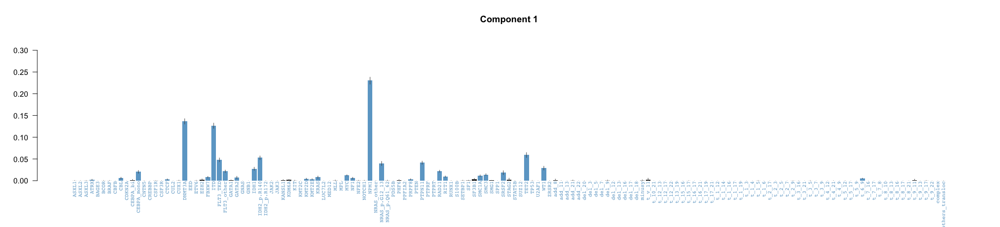

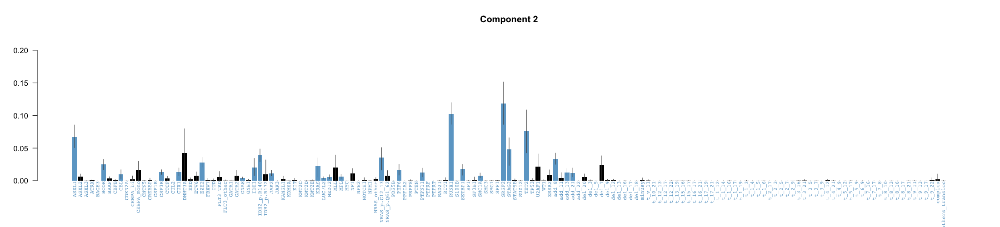

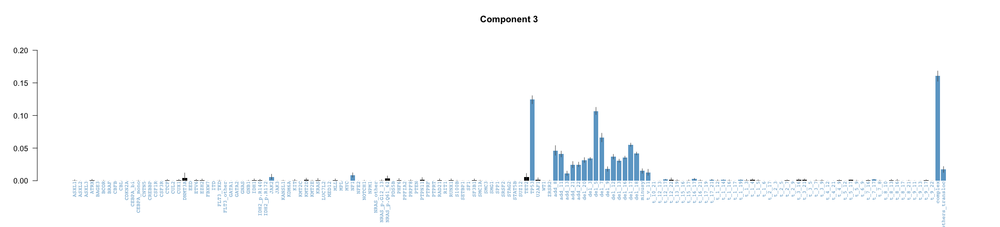

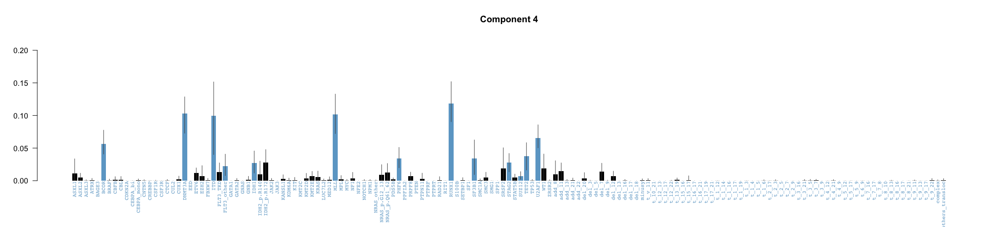

...

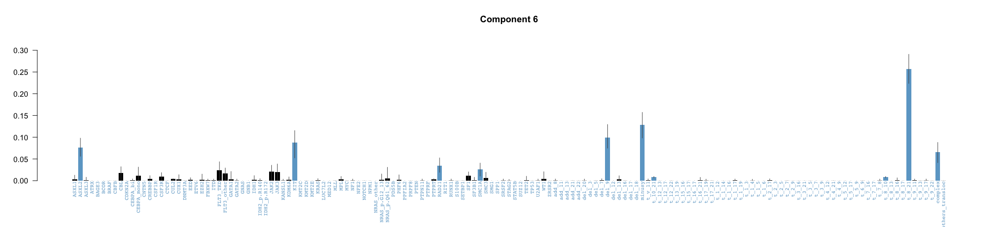

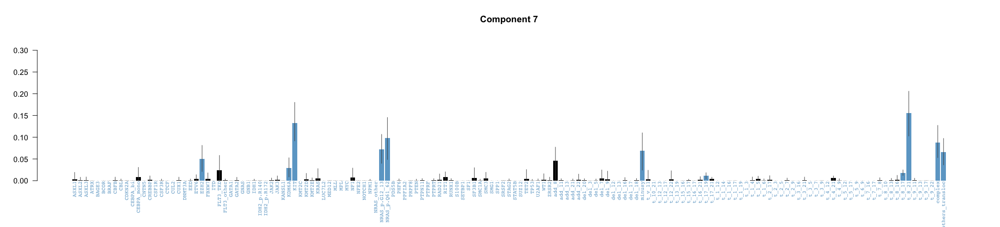

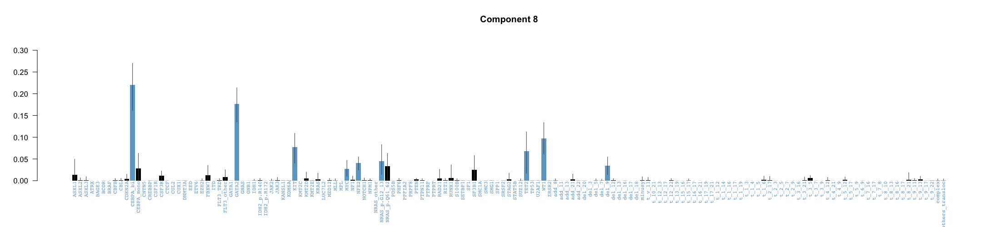

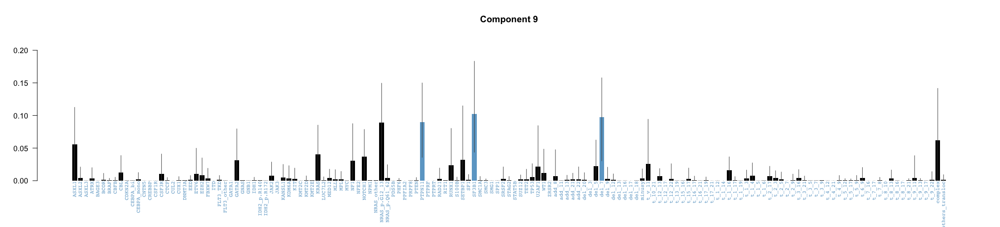

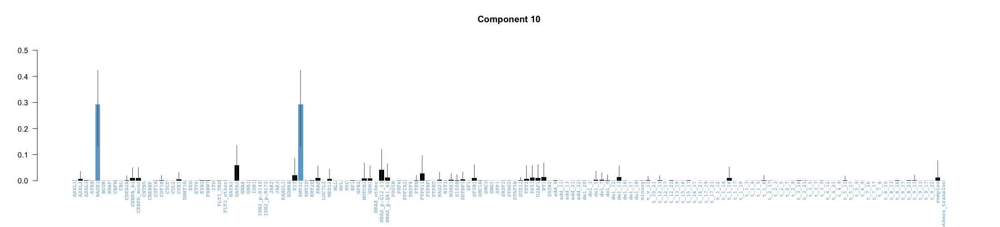

In [202]:
plot_category_distribution_by_component(multi_output_cluster_10, colnames(df_final))

In [203]:
dd_predicted_10_components <- get_prediction_result_dataframe(multi_output_cluster_10, df_final)
get_table(dd_predicted_10_components[,'predicted_component'])

Number of components: 10
Number of NA rows   : 56


,values,count,freq
2,1,851,39.5813953488372
3,2,453,21.0697674418605
4,3,224,10.4186046511628
5,4,180,8.37209302325581
6,5,136,6.32558139534884
7,6,80,3.72093023255814
8,7,62,2.88372093023256
12,NaN,56,2.6046511627907
9,8,48,2.23255813953488
10,9,27,1.25581395348837


notch went outside hinges. Try setting notch=FALSE.


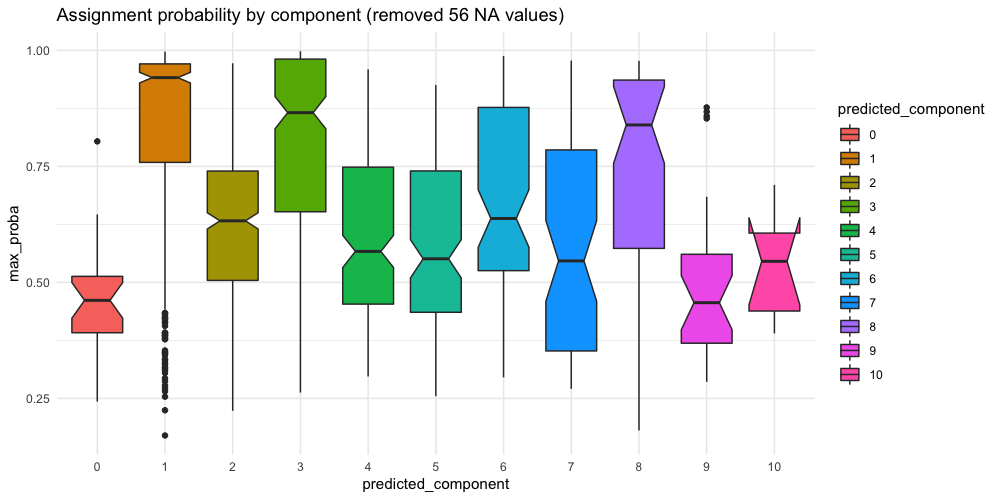

In [204]:
plot_assignement_probability_by_component(dd_predicted_10_components)

##### Let's try another one :
3 chains, 15 initcc, 250 post samples, binomial , 1, 1

In [211]:
data <- df_final
posterior_samples <- 250
initial_clusters <- 15
burn <- 7000
chains <- 3
base_dist <- binomial
aa <- 1
ab <-1

Initialise HDP on a 2150 x 151 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.5 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.5 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 750 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 2151 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of 

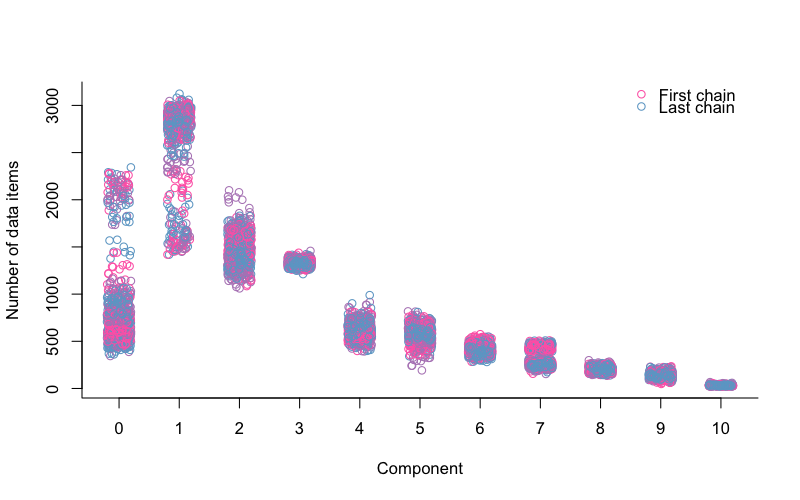

In [212]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_cluster_10 <- extract_components(multi_output)
plot_components_size(multi_output_cluster_10)

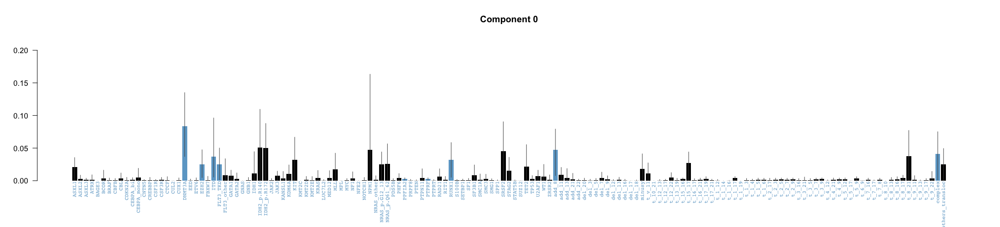

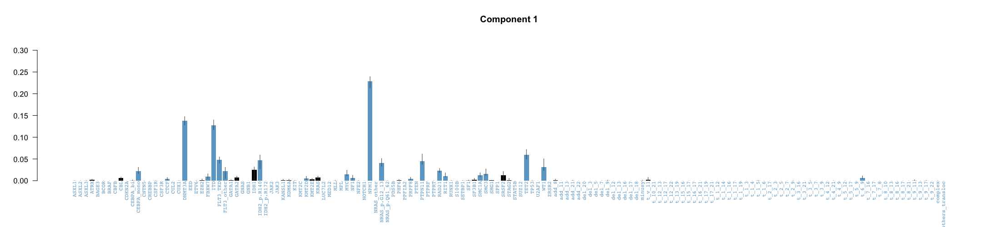

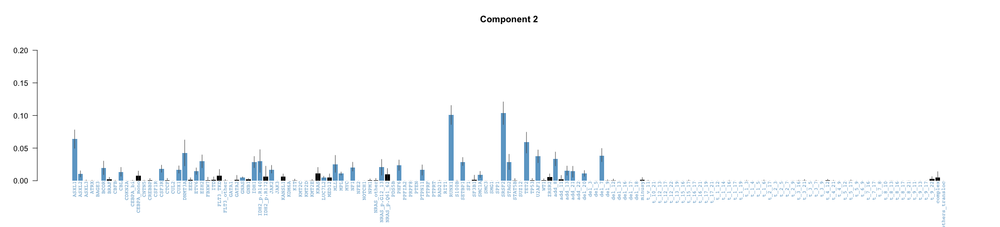

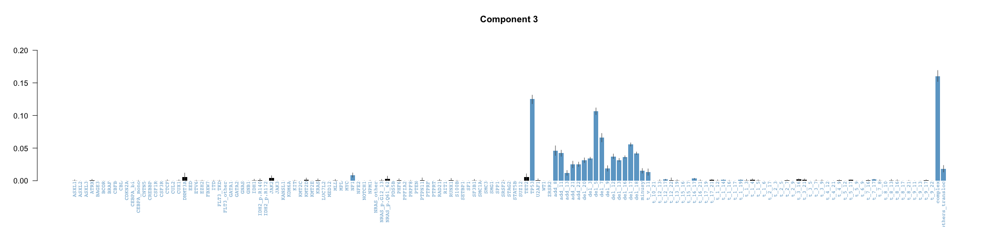

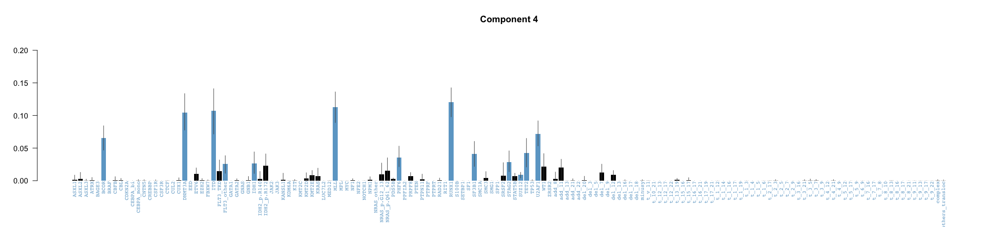

...

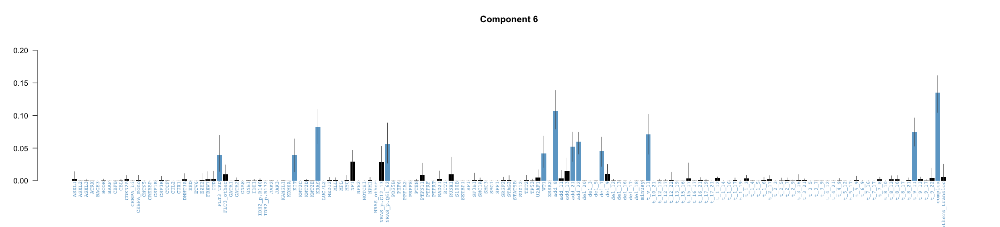

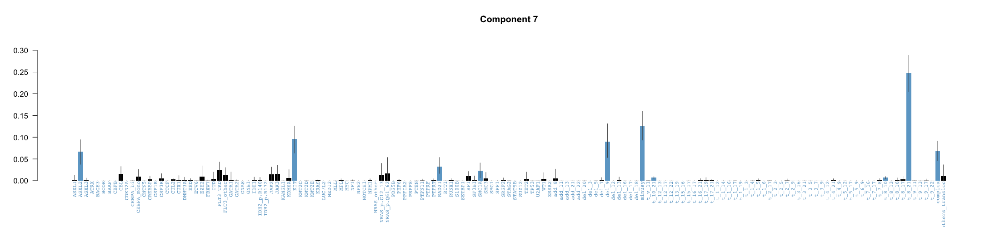

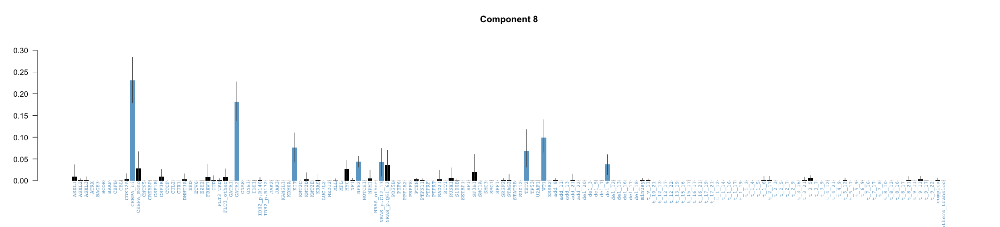

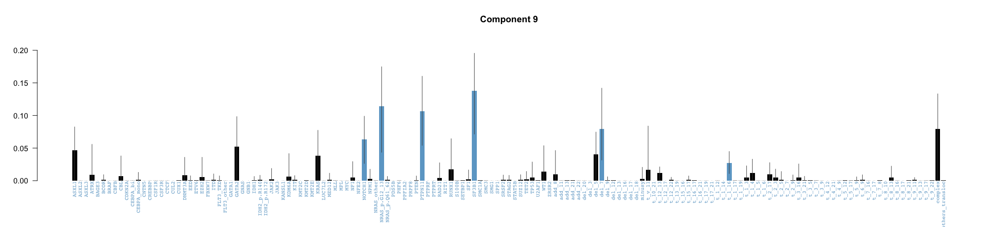

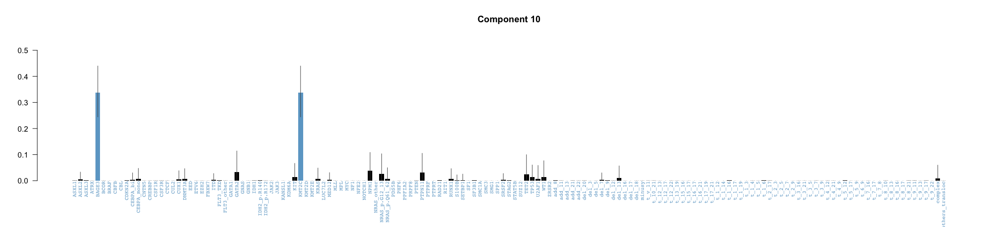

In [213]:
plot_category_distribution_by_component(multi_output_cluster_10, colnames(df_final))

In [214]:
dd_predicted_10_components_bis <- get_prediction_result_dataframe(multi_output_cluster_10, df_final)
get_table(dd_predicted_10_components_bis[,'predicted_component'])

Number of components: 10
Number of NA rows   : 56


,values,count,freq
2,1,838,38.9767441860465
3,2,340,15.8139534883721
4,3,219,10.1860465116279
5,4,144,6.69767441860465
1,0,141,6.55813953488372
7,6,127,5.90697674418605
6,5,112,5.2093023255814
8,7,94,4.37209302325581
12,NaN,56,2.6046511627907
9,8,47,2.18604651162791


notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.


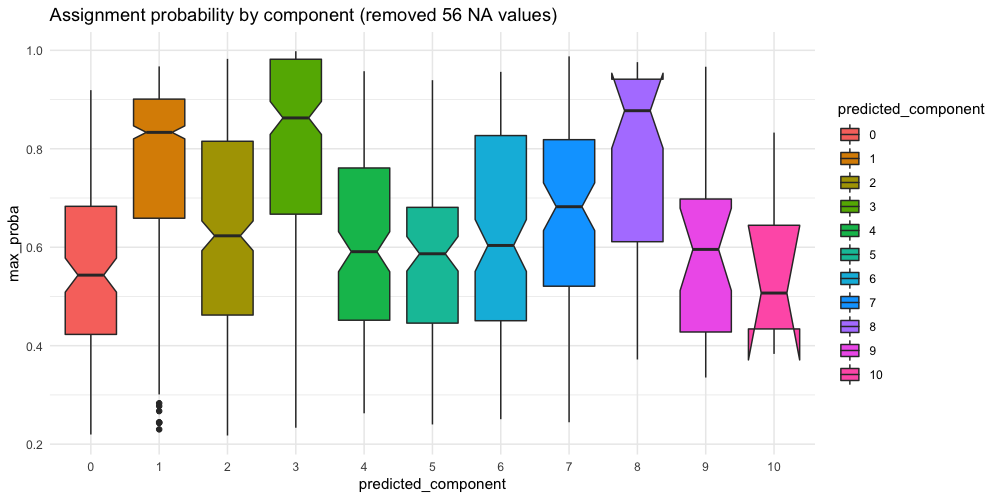

In [217]:
plot_assignement_probability_by_component(dd_predicted_10_components_bis)

# II- ANALYSIS WITH 9 COMPONENTS

3 15 150 5000 gaussian

In [219]:
data <- df_final
posterior_samples <- 150
initial_clusters <- 15
burn <- 5000
chains <- 3
base_dist <- gaussian
aa <- 2
ab <-0.5

Initialise HDP on a 2150 x 151 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 450 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 2151 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of 

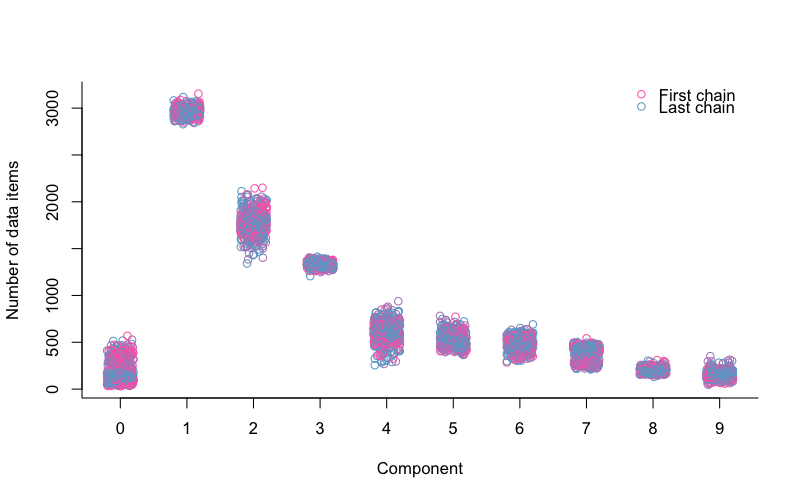

In [220]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_cluster_9 <- extract_components(multi_output)
plot_components_size(multi_output_cluster_9)

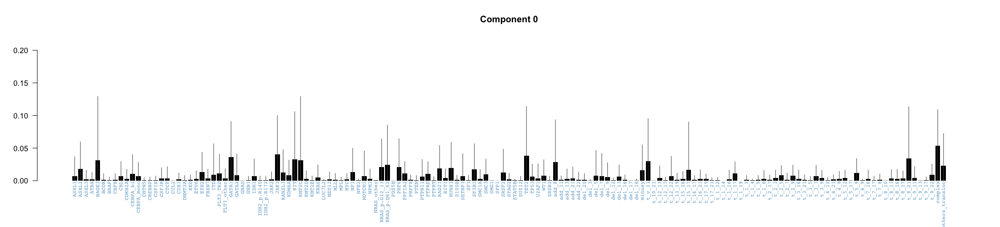

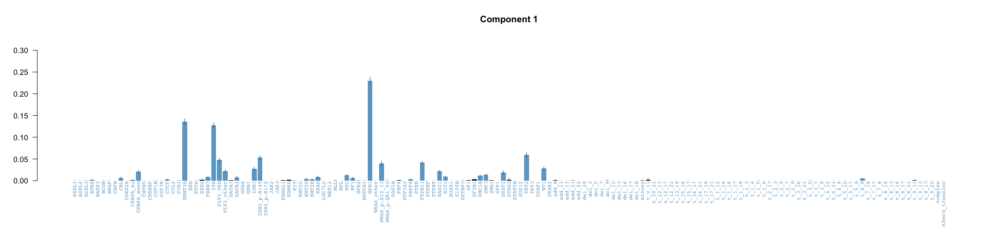

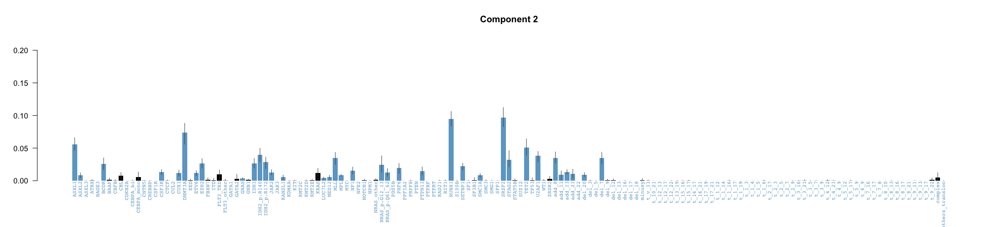

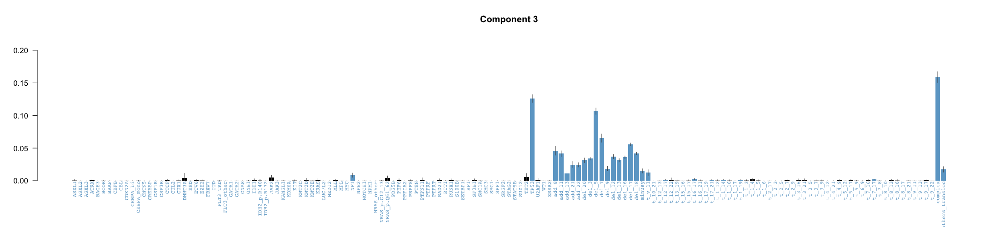

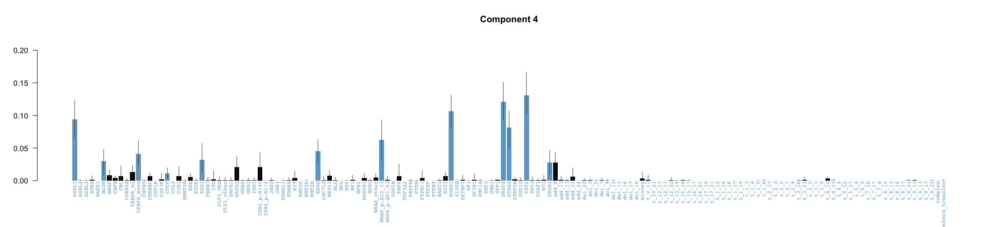

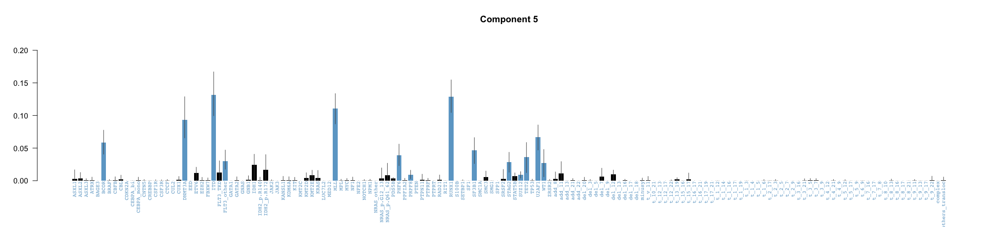

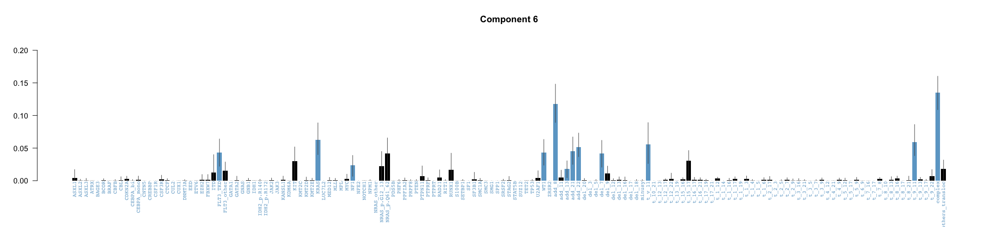

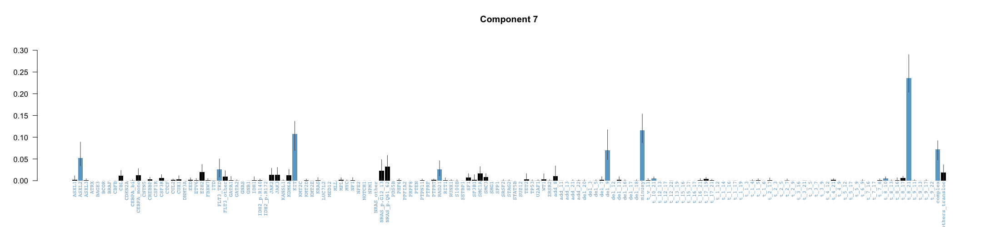

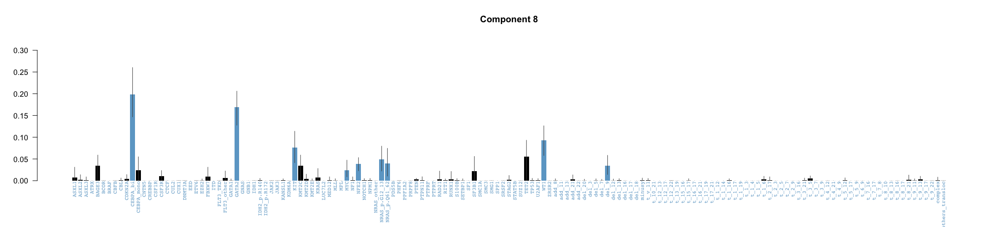

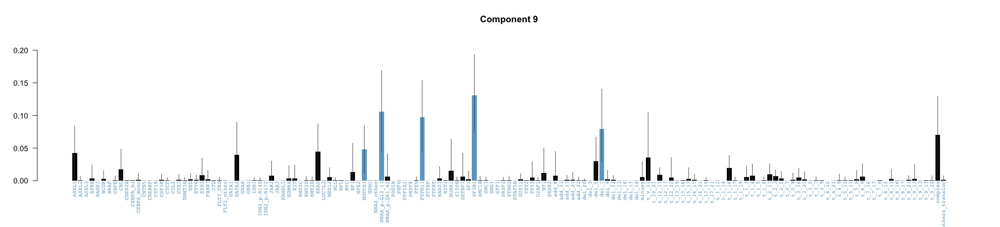

In [221]:
plot_category_distribution_by_component(multi_output_cluster_9, colnames(df_final))

In [224]:
dd_predicted_9_components <- get_prediction_result_dataframe(multi_output_cluster_9, df_final)
get_table(dd_predicted_9_components[,'predicted_component'])

Number of components: 9
Number of NA rows   : 56


,values,count,freq
2,1,855,39.7674418604651
3,2,432,20.093023255814
4,3,219,10.1860465116279
7,6,156,7.25581395348837
8,7,131,6.09302325581395
5,4,108,5.02325581395349
6,5,101,4.69767441860465
11,NaN,56,2.6046511627907
9,8,52,2.41860465116279
10,9,29,1.34883720930233


notch went outside hinges. Try setting notch=FALSE.


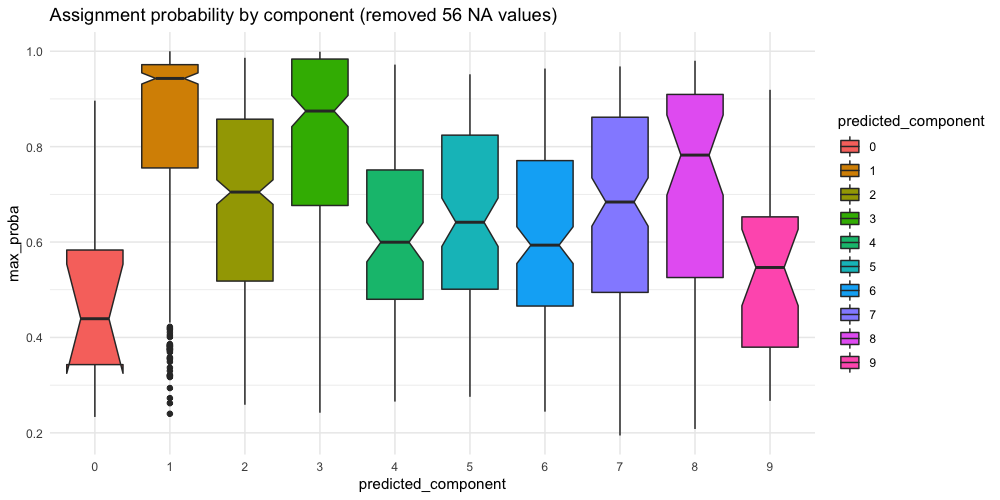

In [225]:
plot_assignement_probability_by_component(dd_predicted_9_components)

In [246]:
dim(dd_predicted_9_components[dd_predicted_9_components$max_proba <0.45 & dd_predicted_9_components$predicted_component==1,])

[1] 41 12

In [251]:
k <- cbind(df_final, dd_predicted_9_components)
k[k$BAGE3==1 & k$KMT2C==1,]

,ASXL1,ASXL2,ASXL3,ATRX,BAGE3,BCOR,BRAF,CBFB,CBL,CDKN2A,CEBPA_bi,CEBPA_mono,CNTN5,CREBBP,CSF1R,CSF3R,CTCF,CUL2,CUX1,DNMT3A,EED,ETV6,EZH2,FBXW7,ITD,FLT3_TKD,FLT3_other,GATA1,GATA2,GNAS,GNB1,IDH1,IDH2_p.R140,IDH2_p.R172,JAK2,JAK3,KANSL1,KDM6A,KIT,KMT2C,KMT2D,KMT2E,KRAS,LUC7L2,MED12,MLL,MPL,MYC,NF1,NFE2,NOTCH1,NPM1,NRAS_other,NRAS_p.G12_13,NRAS_p.Q61_62,PDS5B,PHF6,PPFIA2,PRPF8,PTEN,PTPN11,PTPRF,PTPRT,RAD21,RIT1,RUNX1,S100B,SETBP1,SF1,SF3B1,SMC1A,SMC3,SMG1,SPP1,SRSF2,STAG2,STAT5B,SUZ12,TET2,TP53,U2AF1,WT1,ZRSR2,add_8,add_11,add_13,add_21,add_22,del_20,del_3,del_5,del_7,del_9,del_12,del_13,del_16,del_17,del_18,minusy,t_v_11,t_10_21,t_12_13,t_12_17,t_12_22,t_13_19,t_15_16,t_15_17,t_16_17,t_16_21,t_17_19,t_17_21,t_1_12,t_1_14,t_1_16,t_1_17,t_1_19,t_1_3,t_1_4,t_1_5,t_1_6,t_2_17,t_2_3,t_2_5,t_2_7,t_2_9,t_3_16,t_3_21,t_3_5,t_3_7,t_3_9,t_4_12,t_4_21,t_4_9,t_5_12,t_5_17,t_5_9,t_6_9,t_7_16,t_7_17,t_7_8,t_8_10,t_8_13,t_8_16,t_8_17,t_8_21,t_9_11,t_9_13,t_9_17,t_9_22,complex,others_transloc,component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,predicted_component,max_proba
PD20112a,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.14666667,0.005714286,0.001904762,0.0203174603,0.000952381,0.002222222,0.0193650794,0.0079365079,0.3653968,0.4295238095,9,0.4295238
PD15123a,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.10476190,0.629206349,0.000952381,0.0000000000,0.000000000,0.004761905,0.0015873016,0.0012698413,0.2571429,0.0003174603,1,0.6292063
PD15068a,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.12055556,0.005277778,0.333333333,0.0002777778,0.232500000,0.005000000,0.0038888889,0.0111111111,0.2869444,0.0011111111,2,0.3333333
PD22660a,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.16805556,0.012222222,0.008333333,0.1380555556,0.008333333,0.002500000,0.0069444444,0.2513888889,0.4008333,0.0033333333,8,0.4008333
PD22943a,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.18622222,0.014222222,0.005333333,0.0000000000,0.012444444,0.000000000,0.0004444444,0.0017777778,0.7764444,0.0031111111,8,0.7764444
PD23112c,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.13079365,0.008571429,0.442222222,0.1552380952,0.004126984,0.009523810,0.0025396825,0.0000000000,0.2428571,0.0041269841,2,0.4422222
PD23136a,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

Let's try another one

In [227]:
data <- df_final
posterior_samples <- 450
initial_clusters <- 11
burn <- 7000
chains <- 3
base_dist <- binomial
aa <- 1
ab <-1

Initialise HDP on a 2150 x 151 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "7000 burn-in iterations in 0.4 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 1350 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 2151 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of

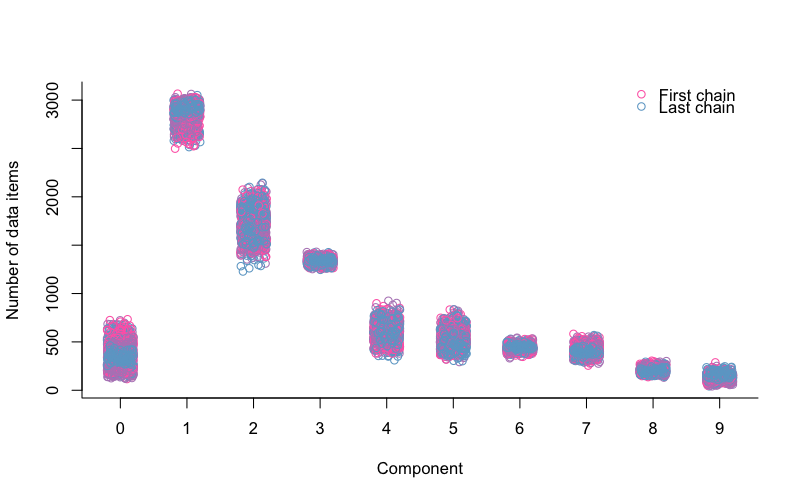

In [228]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_cluster_9 <- extract_components(multi_output)
plot_components_size(multi_output_cluster_9)

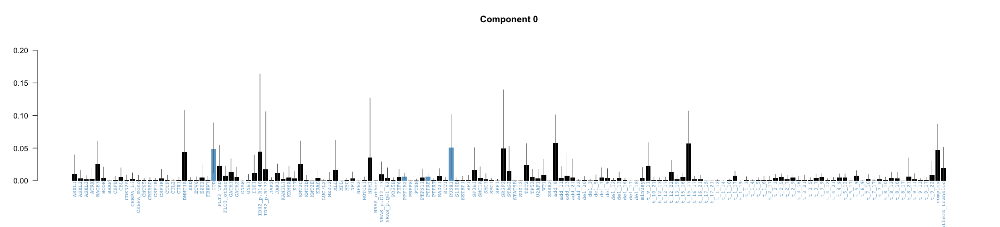

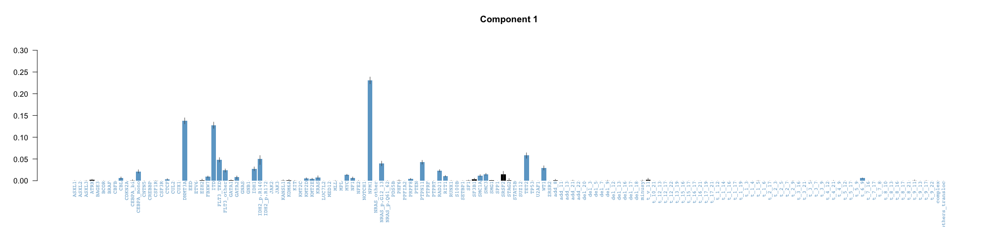

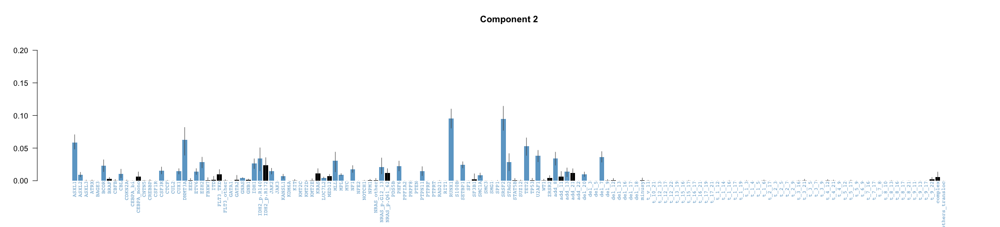

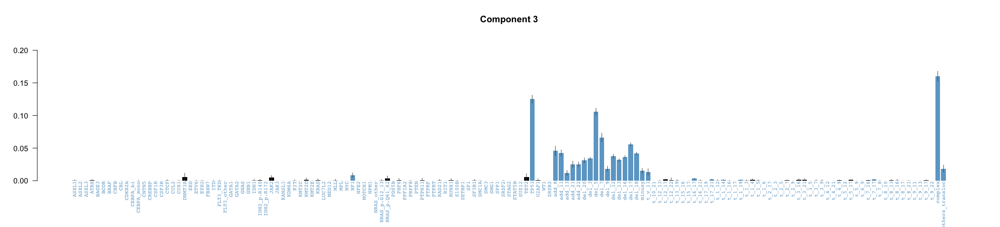

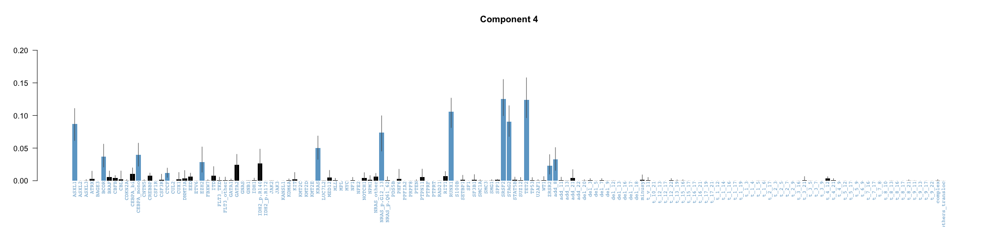

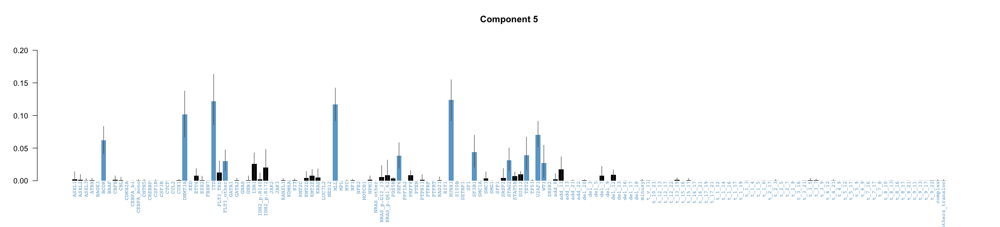

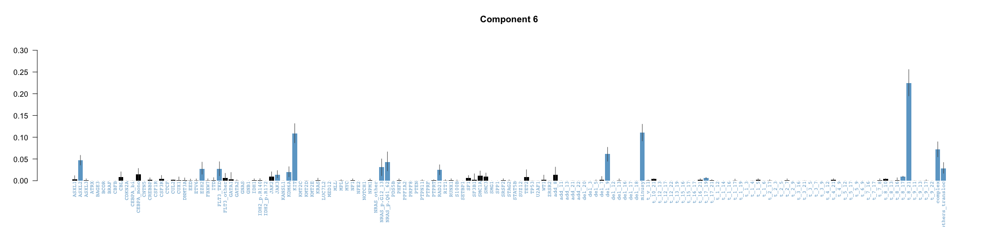

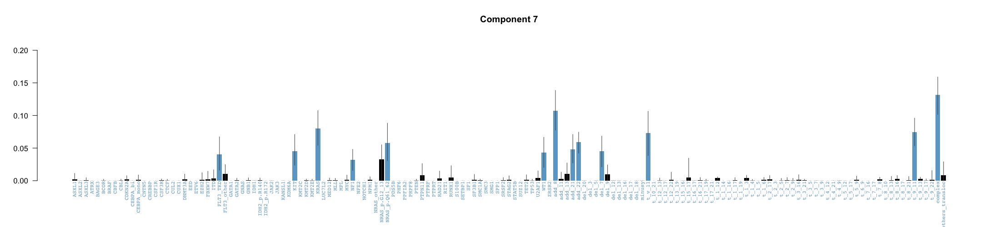

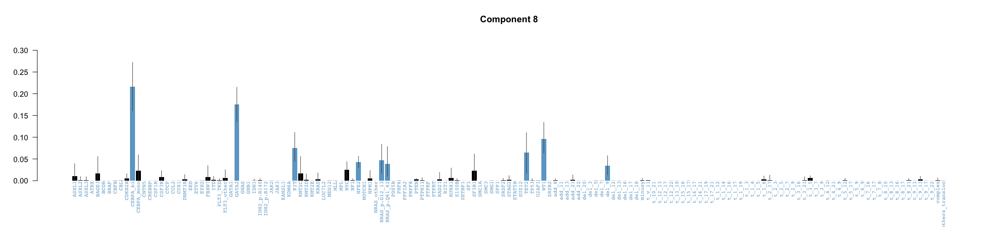

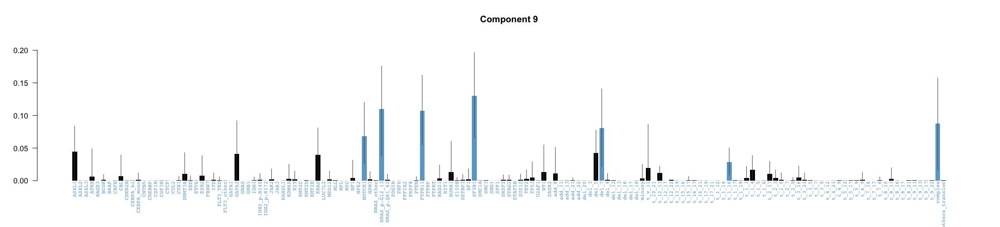

In [229]:
plot_category_distribution_by_component(multi_output_cluster_9, colnames(df_final))

In [230]:
dd_predicted_9_components_bis <- get_prediction_result_dataframe(multi_output_cluster_9, df_final)
get_table(dd_predicted_9_components_bis[,'predicted_component'])

Number of components: 9
Number of NA rows   : 56


,values,count,freq
2,1,846,39.3488372093023
3,2,423,19.6744186046512
4,3,221,10.2790697674419
7,6,133,6.18604651162791
8,7,131,6.09302325581395
5,4,111,5.16279069767442
6,5,110,5.11627906976744
11,NaN,56,2.6046511627907
9,8,51,2.37209302325581
1,0,42,1.95348837209302


notch went outside hinges. Try setting notch=FALSE.


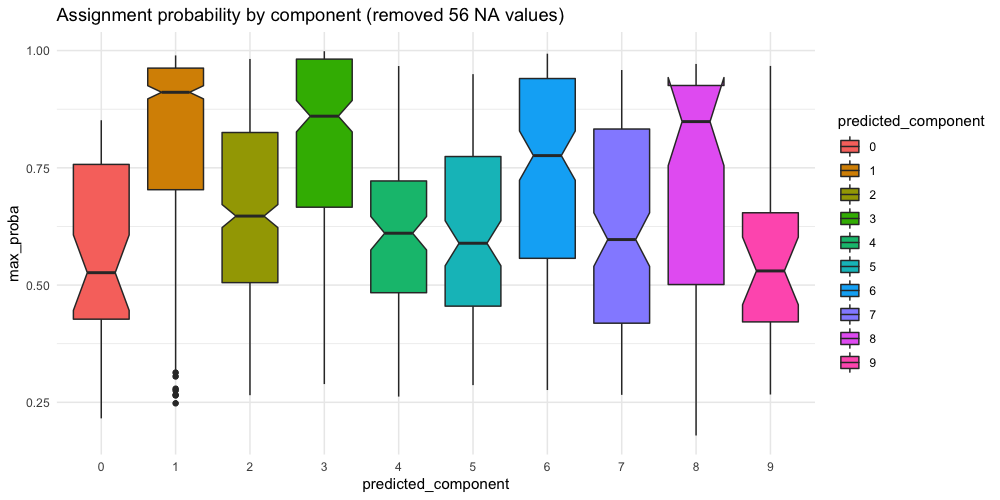

In [231]:
plot_assignement_probability_by_component(dd_predicted_9_components_bis)

In [242]:
dd_predicted_9_components_bis[dd_predicted_9_components_bis$max_proba <0.3 & dd_predicted_9_components_bis$predicted_component==1,]

,component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,predicted_component,max_proba
133,0.18666667,0.2659259,0.1111111,0.0311111111,0.002962963,0.056543210,0.164444444,0.16493827,0.003209877,0.013086420,1,0.2659259
224,0.03481481,0.2646914,0.1792593,0.0000000000,0.154320988,0.151604938,0.008888889,0.06543210,0.101975309,0.039012346,1,0.2646914
422,0.07592593,0.2479630,0.2401852,0.1985185185,0.032962963,0.025185185,0.030185185,0.13925926,0.004629630,0.005185185,1,0.2479630
1083,0.01814815,0.2751852,0.1411111,0.0092592593,0.001851852,0.267777778,0.094074074,0.14185185,0.048148148,0.002592593,1,0.2751852
1270,0.06740741,0.2790123,0.1602469,0.0002469136,0.193580247,0.003950617,0.252345679,0.00691358,0.004691358,0.031604938,1,0.2790123


# III- ANALYSIS WITH 8 COMPONENTS

In [234]:
data <- df_final
posterior_samples <- 250
initial_clusters <- 15
burn <- 5000
chains <- 3
base_dist <- gaussian
aa <- 2
ab <-0.5

Initialise HDP on a 2150 x 151 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 750 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 2151 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of 

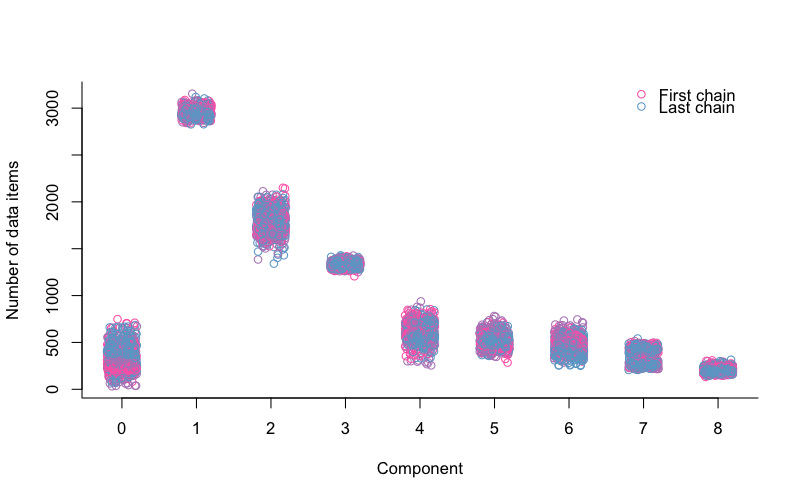

In [235]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_cluster_8 <- extract_components(multi_output)
plot_components_size(multi_output_cluster_8)

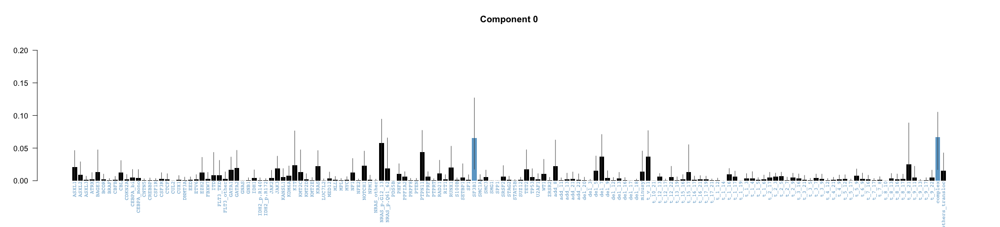

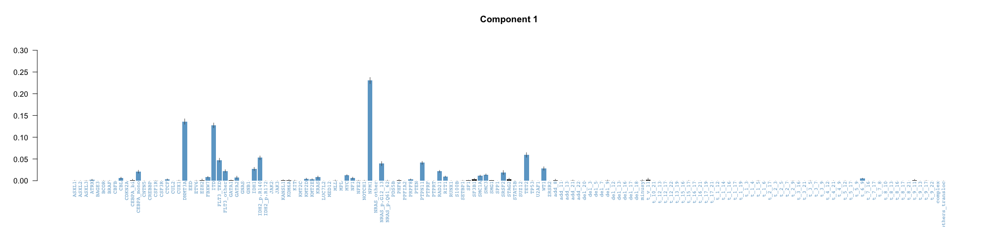

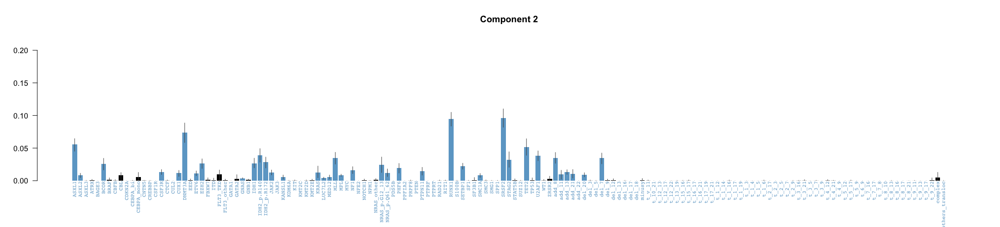

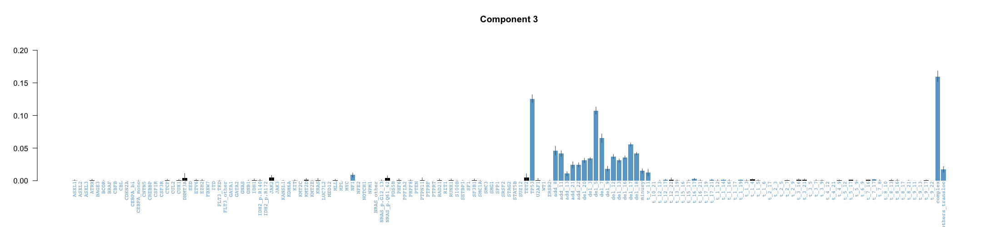

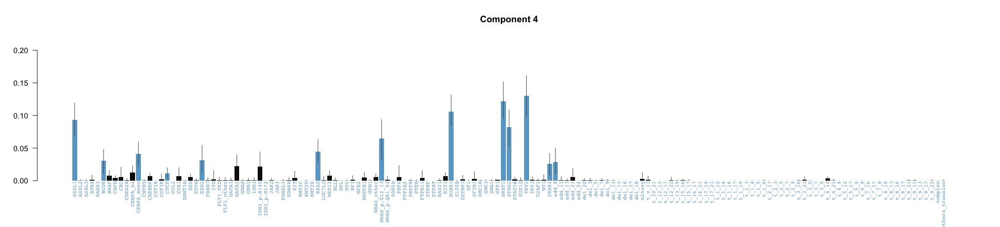

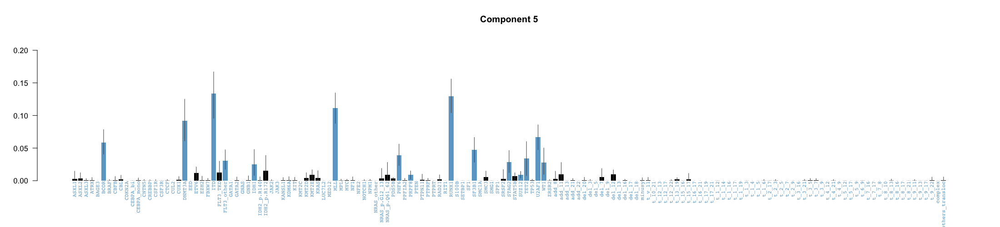

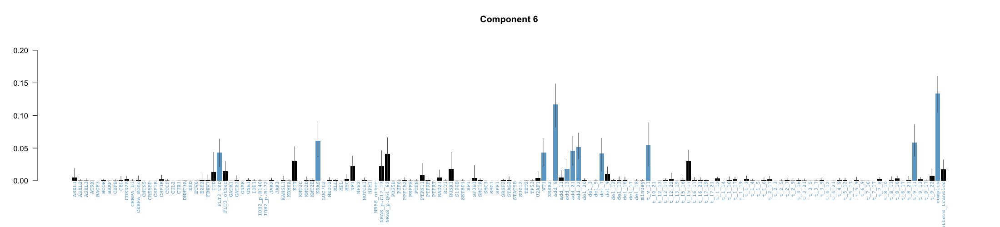

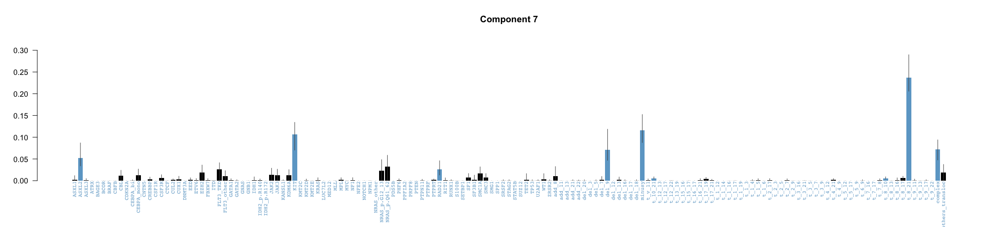

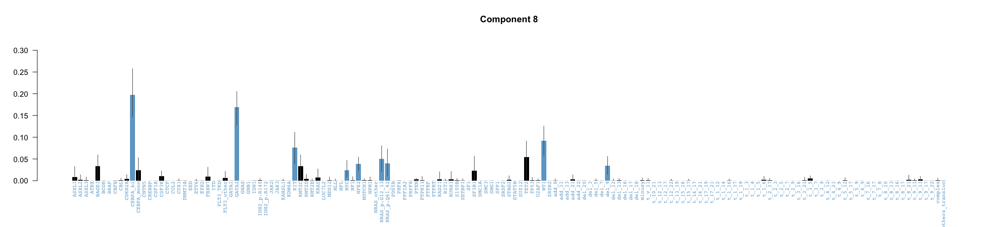

In [236]:
plot_category_distribution_by_component(multi_output_cluster_8, colnames(df_final))

In [237]:
dd_predicted_8_components <- get_prediction_result_dataframe(multi_output_cluster_8, df_final)
get_table(dd_predicted_8_components[,'predicted_component'])

Number of components: 8
Number of NA rows   : 56


,values,count,freq
2,1,852,39.6279069767442
3,2,428,19.906976744186
4,3,221,10.2790697674419
7,6,157,7.30232558139535
8,7,130,6.04651162790698
5,4,110,5.11627906976744
6,5,103,4.7906976744186
10,NaN,56,2.6046511627907
9,8,50,2.32558139534884
1,0,43,2


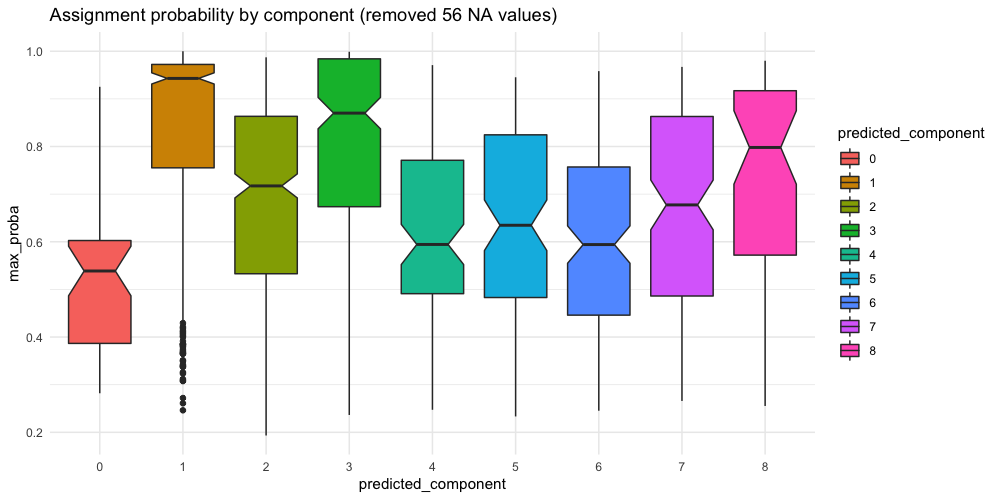

In [238]:
plot_assignement_probability_by_component(dd_predicted_8_components)

# III-Active Learning HDP: we reapply clustering HDP to component 0,2 and 4

##### We have finally decided to keep the HDP leading to 10 components. We will isolate component 0, 2 and 4 and reapply a new optimised HDP clustering on them.

Let's work on people in cluster 0,2 and 4

In [6]:
df_clustered_10_c <- cbind(df_final, dd_predicted_10_components)
df_to_recluster <- df_clustered_10_c[df_clustered_10_c$predicted_component==0 | df_clustered_10_c$predicted_component==2 | df_clustered_10_c$predicted_component==4,]
df_to_recluster <- df_to_recluster[,1:151]  # to keep only columns representing features ( we get rid of the proba components)
df_to_recluster <- na.omit(df_to_recluster)

In [7]:
dim(df_to_recluster)  ## 453 for component 2 , 180 for component 4 and 25 for component 0 : 453+180+25=658

[1] 658 151

In [8]:
num_cols = ncol(df_to_recluster[colSums(df_to_recluster) > 0])  ## keep only column that have at least a mutation
num_cols
bin <- function(x){
    set.seed(123)
  (rbinom(1, num_cols, mean(x))+1)/num_cols
}

###Normal

normal <- function(x){
    set.seed(123)
  abs(rnorm(1,mean(x),sd(x)))
}

###Poisson

poisson <- function(x){
    set.seed(123)
  (rpois(num_cols,1)+1)/num_cols
}

###Uniform equally over all columns

equally <- function(x){
    set.seed(123)
  1/num_cols
}

###Repet 1

repet <- function(x){
    set.seed(123)
  1
}

binomial <- unlist(sapply(df_to_recluster[colSums(df_to_recluster) > 0],bin))
gaussian <- unlist(sapply(df_to_recluster[colSums(df_to_recluster) > 0],normal))
pois <- as.numeric(unlist(sapply(df_to_recluster[colSums(df_to_recluster) > 0],poisson)))
unif <- unlist(sapply(df_to_recluster[colSums(df_to_recluster) > 0],equally))

[1] 115

### III.1     Let's look at the results of different HDP with 6 and 7 components selected

Initialise HDP on a 658 x 115 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes...[1] 115
[1] 115
 done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.4 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.3 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 1350 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 659 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 

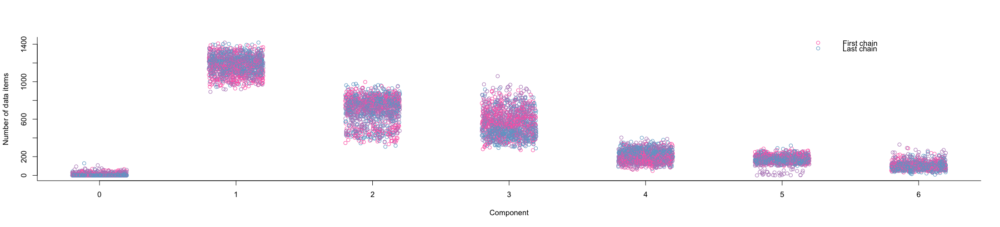

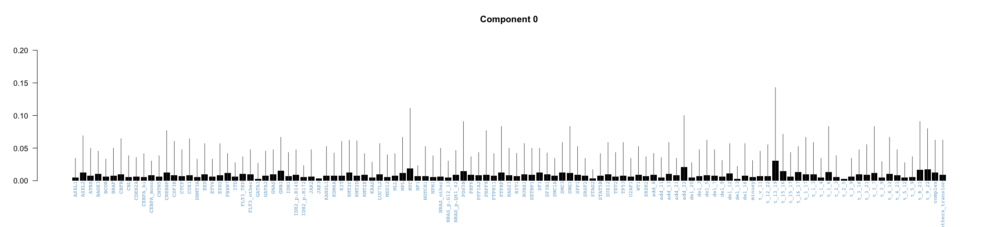

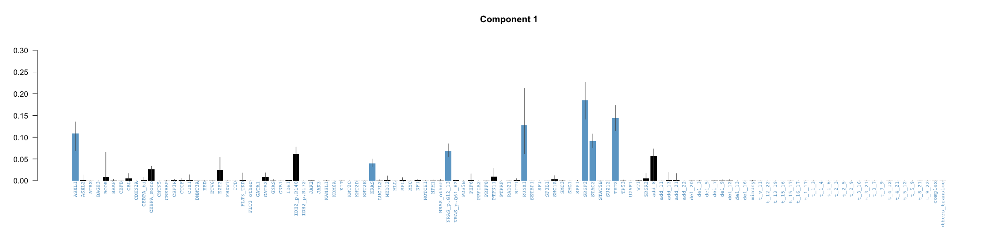

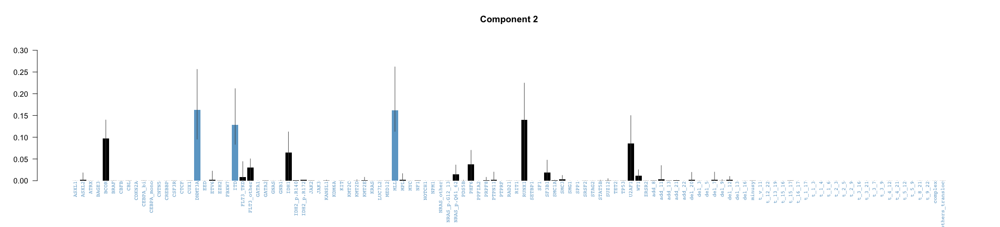

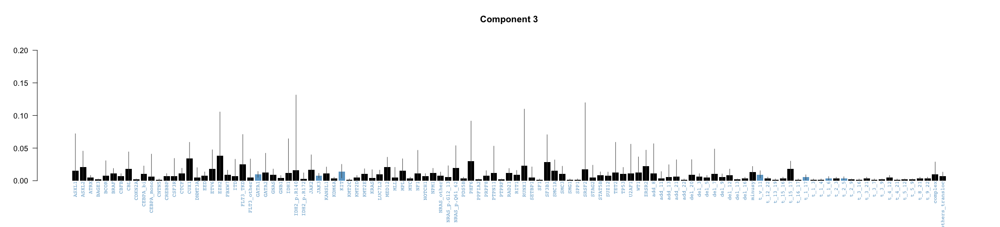

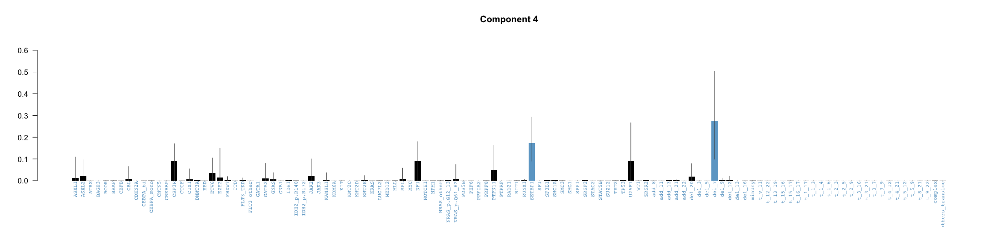

Number of components: 6
Number of NA rows   : 0


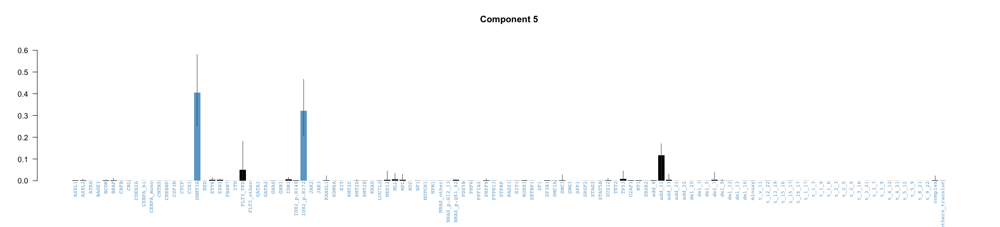

        values count             freq
1            1   333 50.6079027355623
2            2   174 26.4437689969605
3            3    81 12.3100303951368
5            5    41 6.23100303951368
4            4    25 3.79939209726444
6            6     4 0.60790273556231
11 -- total --   658             100%


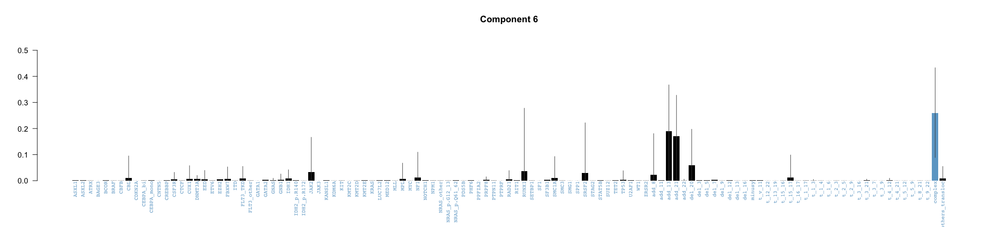

In [17]:
posterior_samples <- 450
initial_clusters <- 13
burn <- 5000
chains <- 3
base_dist <- list(unif)
aa <- 1
ab <-0.5
for (bas in base_dist){

    multi_output <- launch(df_to_recluster[colSums(df_to_recluster) > 0],bas,initial_clusters,burn,posterior_samples,chains,aa,ab)
    multi_output_recluster_1 <- extract_components(multi_output)
    plot_components_size(multi_output_recluster_1)
    plot_category_distribution_by_component(multi_output_recluster_1, colnames(df_to_recluster[colSums(df_to_recluster) > 0]))
    dd_predicted_recluster_1 <- get_prediction_result_dataframe(multi_output_recluster_1, df_to_recluster[colSums(df_to_recluster) > 0])
    print(get_table(dd_predicted_recluster_1[,'predicted_component']))
}

notch went outside hinges. Try setting notch=FALSE.


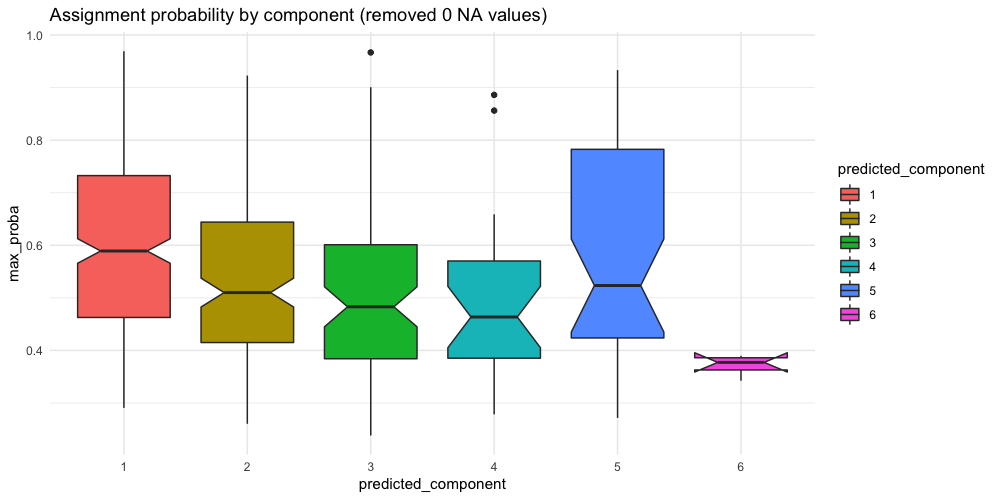

In [27]:
plot_assignement_probability_by_component(dd_predicted_recluster_1)

# HDP CLUSTERING FOR COMPONENT 0,2 AND 4 WE WILL KEEP : 7 COMPONENTS

Initialise HDP on a 658 x 115 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes...[1] 115
[1] 115
 done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.1 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.1 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.1 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 450 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 659 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 .

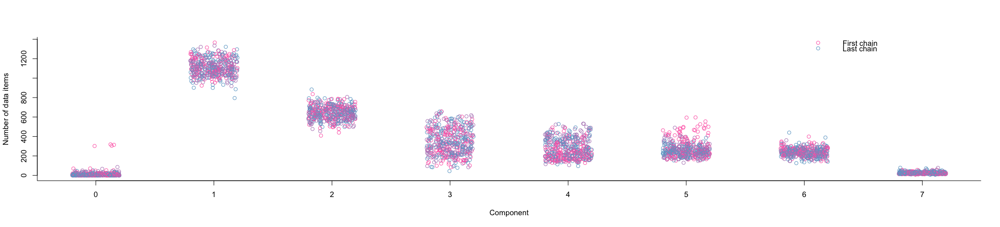

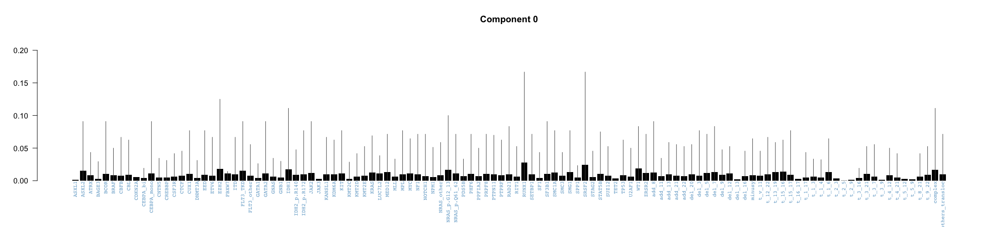

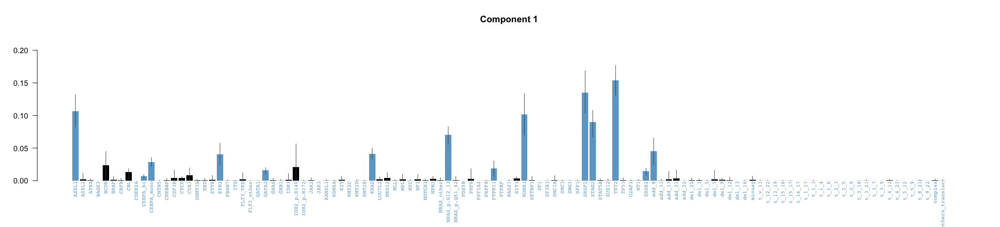

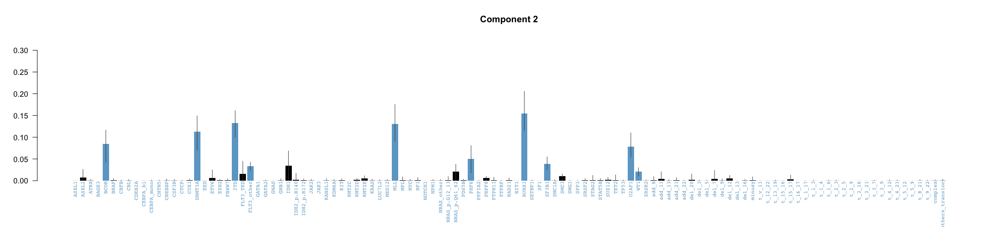

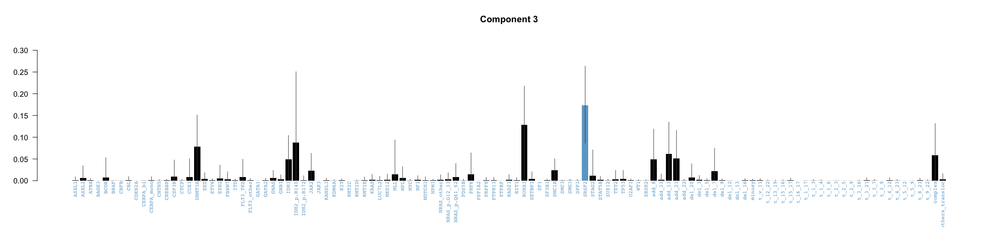

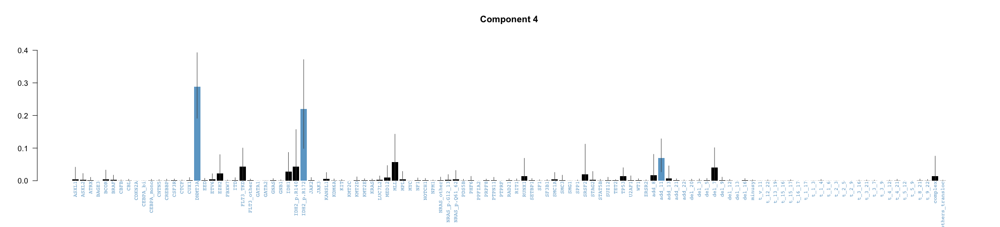

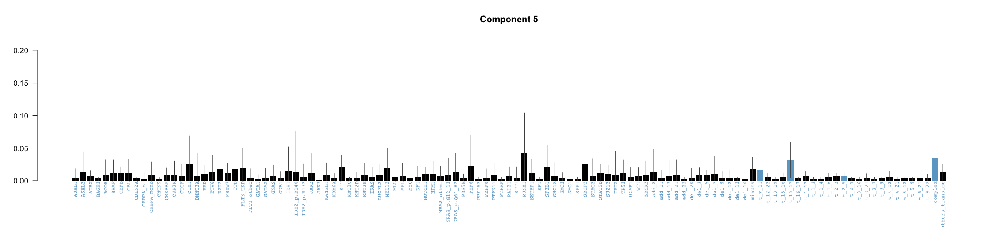

Number of components: 7
Number of NA rows   : 0


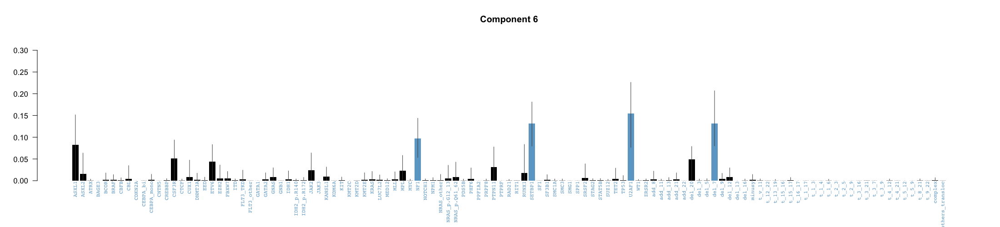

        values count              freq
1            1   304  46.2006079027356
2            2   170  25.8358662613982
4            4    58  8.81458966565349
3            3    52  7.90273556231003
6            6    39  5.92705167173252
5            5    30  4.55927051671733
7            7     5 0.759878419452888
11 -- total --   658              100%


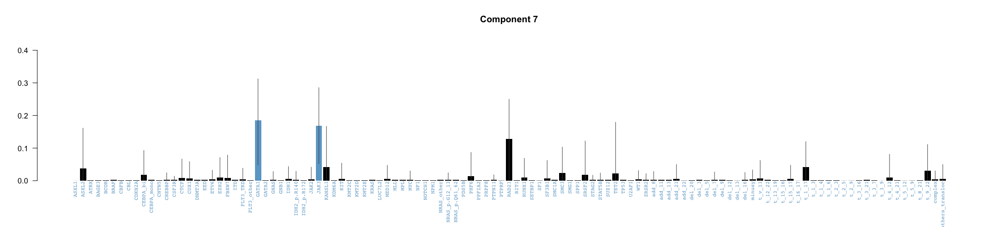

In [24]:
data <- df_to_recluster[colSums(df_to_recluster) > 0]
posterior_samples <- 150
initial_clusters <- 5
burn <- 5000
chains <- 3
base_dist <- list(gaussian)
aa <- 1
ab <-1
for (bas in base_dist){

    multi_output <- launch(df_to_recluster[colSums(df_to_recluster) > 0],bas,initial_clusters,burn,posterior_samples,chains,aa,ab)
    multi_output_recluster_5 <- extract_components(multi_output)
    plot_components_size(multi_output_recluster_5)
    plot_category_distribution_by_component(multi_output_recluster_5, colnames(df_to_recluster[colSums(df_to_recluster) > 0]))
    dd_predicted_recluster_5 <- get_prediction_result_dataframe(multi_output_recluster_5, df_to_recluster[colSums(df_to_recluster) > 0])
    print(get_table(dd_predicted_recluster_5[,'predicted_component']))
}

notch went outside hinges. Try setting notch=FALSE.


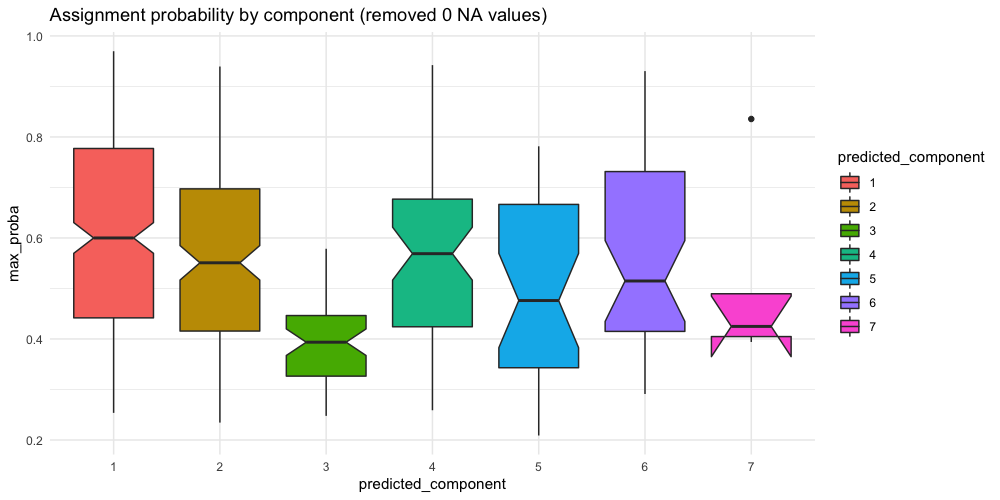

In [28]:
plot_assignement_probability_by_component(dd_predicted_recluster_5)

# IV-Elli's request to look at stacked barplot of reapplied hdp to component 1,2,4,8,10
##### Keep only people belonging to clusters 1,2,4,8,10 and remove columns that we do not need and reapply hdp to those components

In [34]:
df_clustered <- cbind(df_final, dd_predicted_10_components)

In [35]:
df_few_clustered <- df_clustered[df_clustered$predicted_component == 1 | df_clustered$predicted_component == 2 | df_clustered$predicted_component == 4 | df_clustered$predicted_component == 8 | df_clustered$predicted_component == 10,]
dim(df_few_clustered) 
df_few_clustered <- df_few_clustered[,1:151]
dim(df_few_clustered[,1:151] )
df_few_clustered <- na.omit(df_few_clustered)

[1] 1596  164

[1] 1596  151

#### Let's delete also those features as they are all 0 in the whole subdataset

In [36]:
name <- as.vector(rownames(data.frame(colSums(df_few_clustered[,(colSums(df_few_clustered))==0]))))
name
df_few_clustered[name] <- list(NULL)
dim(df_few_clustered)

[1] "CUL2"    "PTPRT"   "del_17"  "t_10_21" "t_12_13" "t_12_17" "t_12_22"
 [8] "t_16_17" "t_17_19" "t_17_21" "t_1_12"  "t_1_14"  "t_1_17"  "t_1_19" 
[15] "t_1_5"   "t_1_6"   "t_2_17"  "t_2_3"   "t_2_5"   "t_2_7"   "t_3_9"  
[22] "t_4_9"   "t_5_17"  "t_5_9"   "t_7_16"  "t_7_17"  "t_7_8"   "t_8_10" 
[29] "t_8_13"  "t_8_16"  "t_8_17"

[1] 1540  120

In [37]:
num_cols = ncol(df_few_clustered)  ## keep only column that have at least a mutation
bin <- function(x){
    set.seed(123)
  (rbinom(1, num_cols, mean(x))+1)/num_cols
}

###Normal

normal <- function(x){
    set.seed(123)
  abs(rnorm(1,mean(x),sd(x)))
}

###Poisson

poisson <- function(x){
    set.seed(123)
  (rpois(num_cols,1)+1)/num_cols
}

###Uniform equally over all columns

equally <- function(x){
    set.seed(123)
  1/num_cols
}

###Repet 1

repet <- function(x){
    set.seed(123)
  1
}

binomial <- unlist(sapply(df_few_clustered,bin))
gaussian <- unlist(sapply(df_few_clustered,normal))
pois <- as.numeric(unlist(sapply(df_few_clustered,poisson)))
unif <- unlist(sapply(df_few_clustered,equally))

In [46]:
data <- df_few_clustered
posterior_samples <- 350
initial_clusters <- 1:5
burn <- 5000
chains <- 3
base_dist <- gaussian
aa <- 1
ab <-1

In [ ]:
for (initcc in initial_clusters){
    for(post in posterior_samples){
    multi_output <- launch(data,base_dist,initcc,burn,post,chains,aa,ab)
    multi_output_recluster <- extract_components(multi_output)
    #plot_components_size(multi_output_recluster)
    dd_predicted <- get_prediction_result_dataframe(multi_output_recluster, df_to_recluster)
    print(get_table(dd_predicted[,'predicted_component']))
}}

In [245]:
data <- df_few_clustered
posterior_samples <- 350
initial_clusters <- 3
burn <- 5000
chains <- 3
base_dist <- gaussian
aa <- 2
ab <-0.5

Initialise HDP on a 1540 x 120 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!
### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.1 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.1 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "5000 burn-in iterations in 0.2 mins"

Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 1050 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 1541 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of

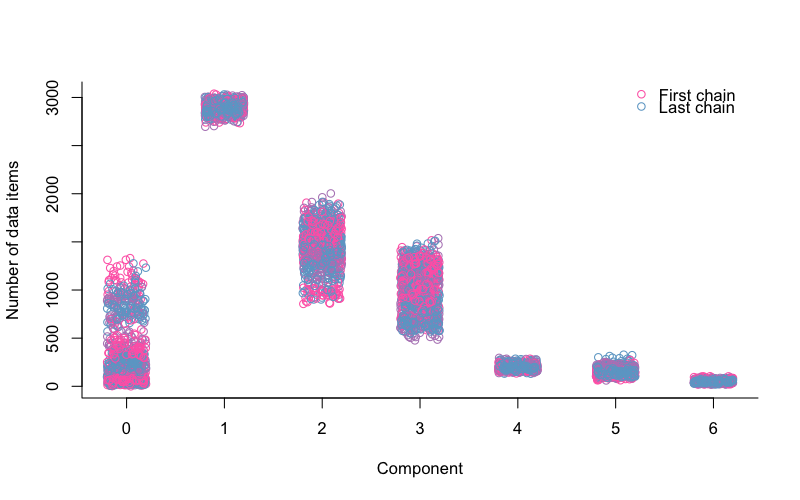

In [49]:
multi_output <- launch(data,base_dist,initial_clusters,burn,posterior_samples,chains,aa,ab)
multi_output_few <- extract_components(multi_output)
plot_components_size(multi_output_few)

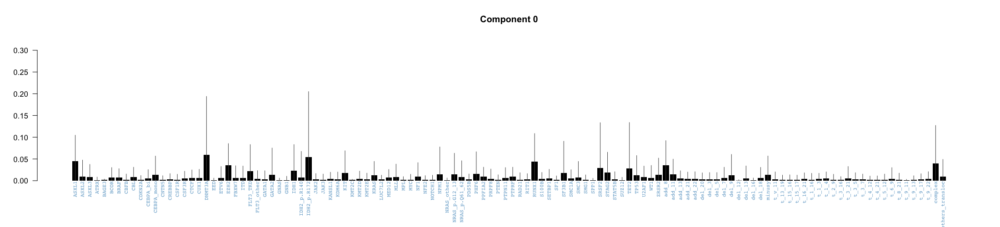

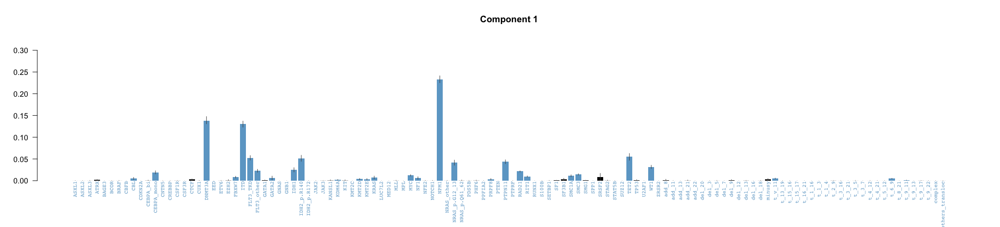

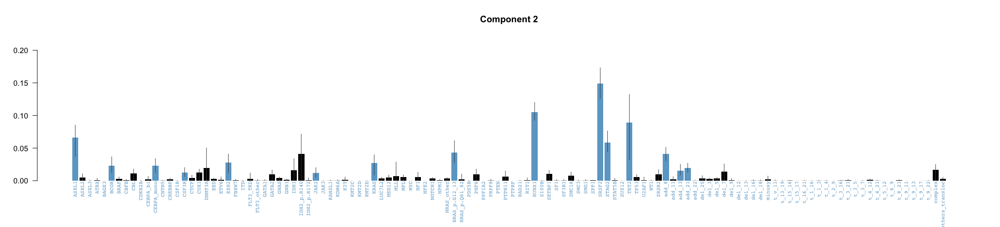

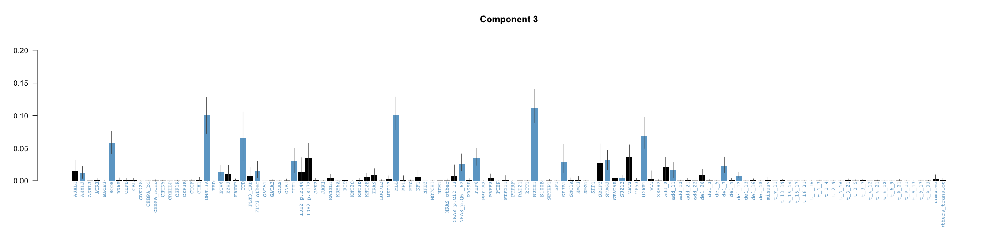

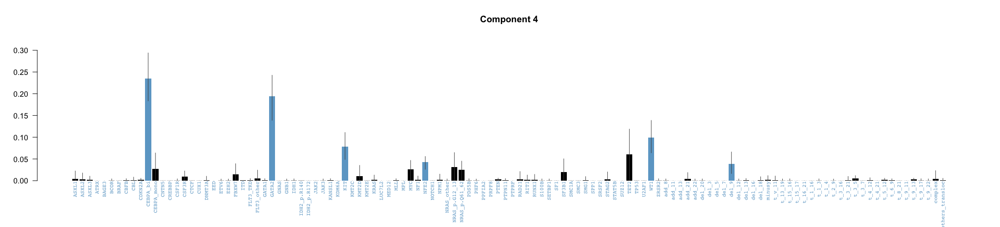

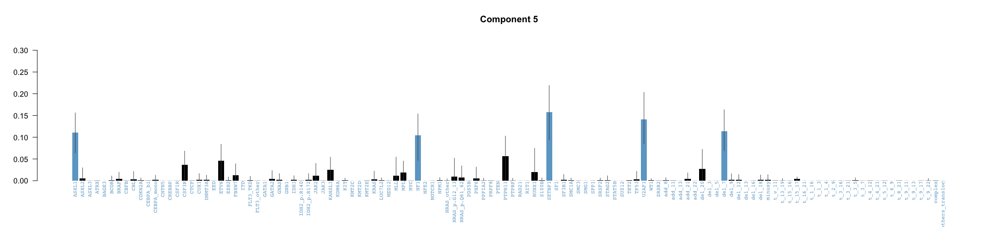

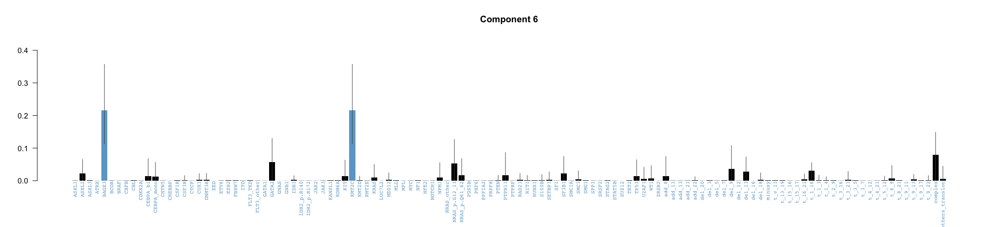

In [50]:
plot_category_distribution_by_component(multi_output_few, colnames(df_few_clustered))

In [51]:
dd_predicted_few <- get_prediction_result_dataframe(multi_output_few, df_few_clustered)
get_table(dd_predicted_few[,'predicted_component'])

Number of components: 6
Number of NA rows   : 0


,values,count,freq
2,1,853,55.3896103896104
3,2,342,22.2077922077922
4,3,263,17.0779220779221
5,4,46,2.98701298701299
6,5,25,1.62337662337662
7,6,8,0.519480519480519
1,0,3,0.194805194805195
11,-- total --,1540,100%


notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.
notch went outside hinges. Try setting notch=FALSE.


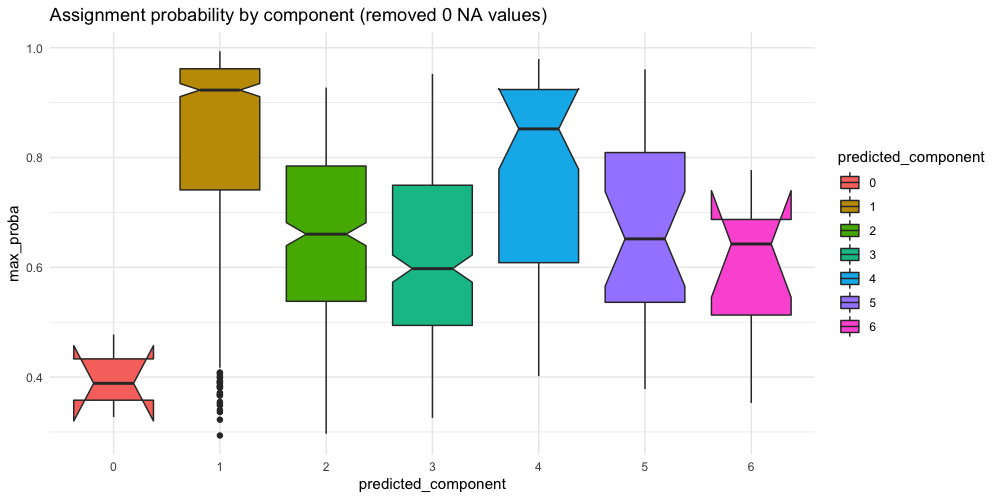

In [53]:
plot_assignement_probability_by_component(dd_predicted_few)

In [52]:
write.table(dd_predicted_few,'dd_predicted_few.tsv',sep='\t',quote=F)

# V- Elli's request stacked barplot to look at the ratio of components of initial clustering in the new clustering with 6 components 

In [56]:
df_10_component <- cbind(df_final, dd_predicted_10_components)
dim(df_10_component)

[1] 2150  164

In [108]:
df_5_component <- df_10_component[df_10_component$predicted_component == 1 | df_10_component$predicted_component == 2 | df_10_component$predicted_component == 4 | df_10_component$predicted_component == 8 | df_10_component$predicted_component == 10,]
dim(df_5_component)
df_5_component$predicted_old_component <- df_5_component$predicted_component
dim(df_5_component)
df_5_component <- df_5_component['predicted_old_component']
df_5_component <- na.omit(df_5_component)
dim(df_5_component)

[1] 1596  164

[1] 1596  165

[1] 1540    1

In [114]:
tmp <- cbind(df_5_component, dd_predicted_few['predicted_component'])
unique(tmp$predicted_old_component)
#tmp$predicted_component=as.numeric(tmp$predicted_component)

[1]  1  4  8  2 10

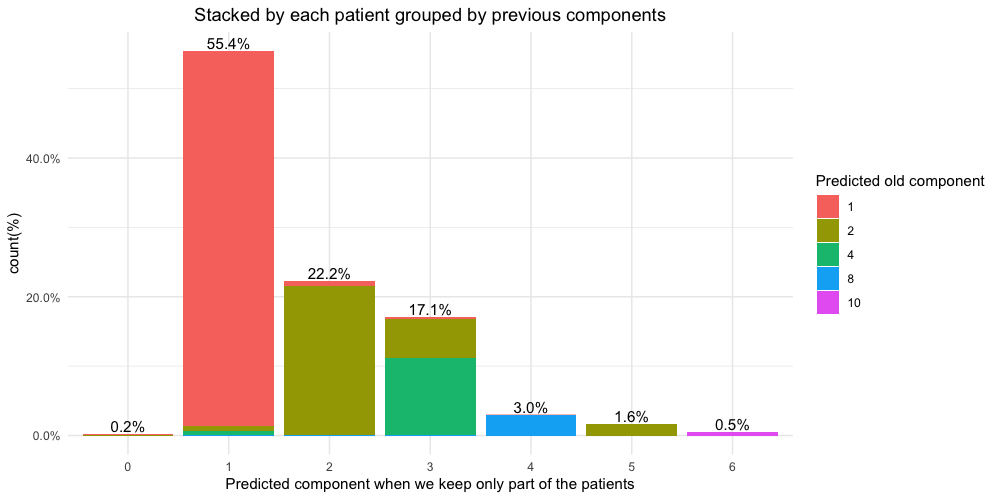

In [132]:
ggplot(tmp, aes(predicted_component)) +
geom_bar(aes(y = (..count..)/sum(..count..),fill=factor(predicted_old_component)))+
geom_text(aes(y = ((..count..)/sum(..count..)), label = scales::percent((..count..)/sum(..count..))), stat = "count", vjust = -0.25) +
scale_y_continuous(labels = percent) +
labs(x = "Predicted component when we keep only part of the patients",title="Stacked by each patient grouped by previous components",fill="Predicted old component",y="count(%)")+
theme(plot.title = element_text(hjust = 0.5))

# VI- Features Activation per component

In [144]:
df_10_component <- cbind(df_final, dd_predicted_10_components['predicted_component'])
df_10_component <- na.omit(df_10_component)
tmp_cat <- as.data.frame(sapply(df_10_component, as.numeric))
categories_repartition <- data.frame(category = colnames(tmp_cat[1:(length(tmp_cat)-1)]))
for (i in 0:10)
    categories_repartition[sprintf('component_%d', i)] <- apply(categories_repartition, 1, function(s) sum(tmp_cat[tmp_cat$predicted_component == i, s['category']]))
categories_repartition['total_count'] <- rowSums(categories_repartition[,-1])
categories_repartition <- categories_repartition[order(categories_repartition$total_count, decreasing = TRUE),]
head(categories_repartition,50)   

,category,component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,total_count
52,NPM1,0,668,6,1,1,3,0,1,0,0,2,682
20,DNMT3A,2,370,98,24,84,6,2,1,1,0,1,589
25,ITD,7,357,16,3,67,2,4,0,0,0,0,456
79,TET2,4,174,145,19,28,3,4,2,9,0,1,389
150,complex,5,12,23,202,2,55,14,15,1,6,2,337
66,RUNX1,4,12,193,11,81,11,1,1,2,1,1,318
75,SRSF2,3,67,219,4,9,3,1,0,0,0,0,306
54,NRAS_p.G12_13,2,120,74,6,8,10,2,14,4,11,3,254
33,IDH2_p.R140,0,146,77,8,6,2,2,0,1,0,0,242
84,add_8,2,23,71,61,4,46,1,6,0,0,0,214


### PLOT THE INITIAL HEATMAP WITHOUT THE ACTIVE LEARENING HDP PART

In [188]:
tmp_10 <- df_10_component[order(df_10_component$predicted_component),]
tmp_10 <- tmp_10[tmp_10$predicted_component==1 | tmp_10$predicted_component==2 | tmp_10$predicted_component==3 | tmp_10$predicted_component==4 | tmp_10$predicted_component==5 | tmp_10$predicted_component==6 | tmp_10$predicted_component==7 | tmp_10$predicted_component==8 | tmp_10$predicted_component==9 | tmp_10$predicted_component==10 ,]
transp_df_10 <-(as.data.frame(t(tmp_10)))
transp_df_10$features <- rownames(transp_df_10)
transp_df_10 <- transp_df_10[-nrow(transp_df_10),]
melt.data<-melt(transp_df_10,id.vars ="features", variable_name=colnames(transp_df_10))

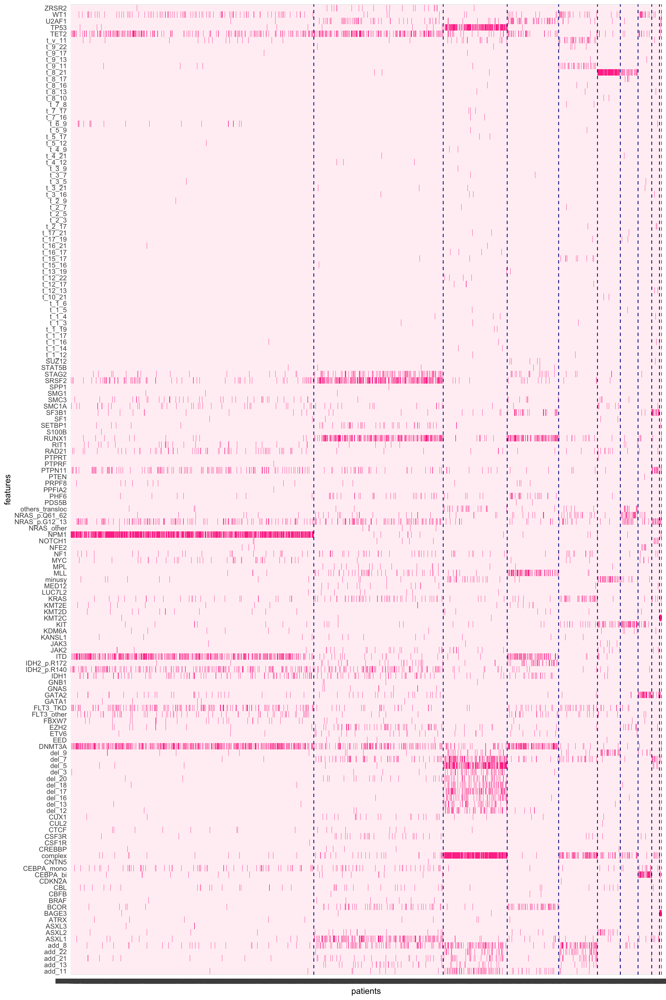

In [213]:
options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_10_component$predicted_component)   ## to separate by component
# plot the heatmap
ggplot(melt.data, aes(variable,features)) +
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c('0' = 'lavenderblush1', '1' = 'violetred1')) +
geom_vline(xintercept = cumsum(col_sep) + 0.5, col = 'darkblue', linetype = 2, size = 0.5) +
labs(x = 'patients') 

# HEATMAP WITH ACTIVE LEARNING CLUSTERING WHICH IS ALSO FINAL CLUSTERING

##### We have now 15 components 

In [1]:
df_all_components <- read.table("../../../data/updated_dataset/all_components.tsv",sep = '\t' , header = T)

##### Let's first look at the most frequent features by component in the dataset

In [3]:
tmp_cat <- as.data.frame(sapply(df_all_components, as.numeric))
categories_repartition <- data.frame(category = colnames(tmp_cat[1:(length(tmp_cat)-1)]))
for (i in 1:15)
    categories_repartition[sprintf('component_%d', i)] <- apply(categories_repartition, 1, function(s) sum(tmp_cat[tmp_cat$predicted_component == i, s['category']]))
categories_repartition['total_count'] <- rowSums(categories_repartition[,-1])
categories_repartition <- categories_repartition[order(categories_repartition$total_count, decreasing = TRUE),]
head(categories_repartition,50)   

,category,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,component_12,component_13,component_14,component_15,total_count
52,NPM1,668,1,3,0,1,0,0,2,6,1,0,0,0,0,0,682
20,DNMT3A,370,24,6,2,1,1,0,1,37,63,27,49,3,4,1,589
25,ITD,357,3,2,4,0,0,0,0,8,74,1,1,5,1,0,456
79,TET2,174,19,3,4,2,9,0,1,144,22,2,1,3,1,4,389
150,complex,12,202,55,14,15,1,6,2,6,1,13,2,8,0,0,337
66,RUNX1,12,11,11,1,1,2,1,1,131,93,31,8,8,7,0,318
75,SRSF2,67,4,3,1,0,0,0,0,157,17,44,6,2,3,2,306
54,NRAS_p.G12_13,120,6,10,2,14,4,11,3,71,8,2,1,1,1,0,254
33,IDH2_p.R140,146,8,2,2,0,1,0,0,43,11,22,7,0,0,0,242
84,add_8,23,61,46,1,6,0,0,0,49,10,11,5,2,0,0,214


In [7]:
tmp_all <- df_all_components[order(df_all_components$predicted_component),]
transp_df_all <-(as.data.frame(t(tmp_all)))
transp_df_all$features <- rownames(transp_df_all)
transp_df_all <- transp_df_all[-nrow(transp_df_all),]
melt.data_all<-melt(transp_df_all,id.vars ="features", variable_name=colnames(transp_df_all))

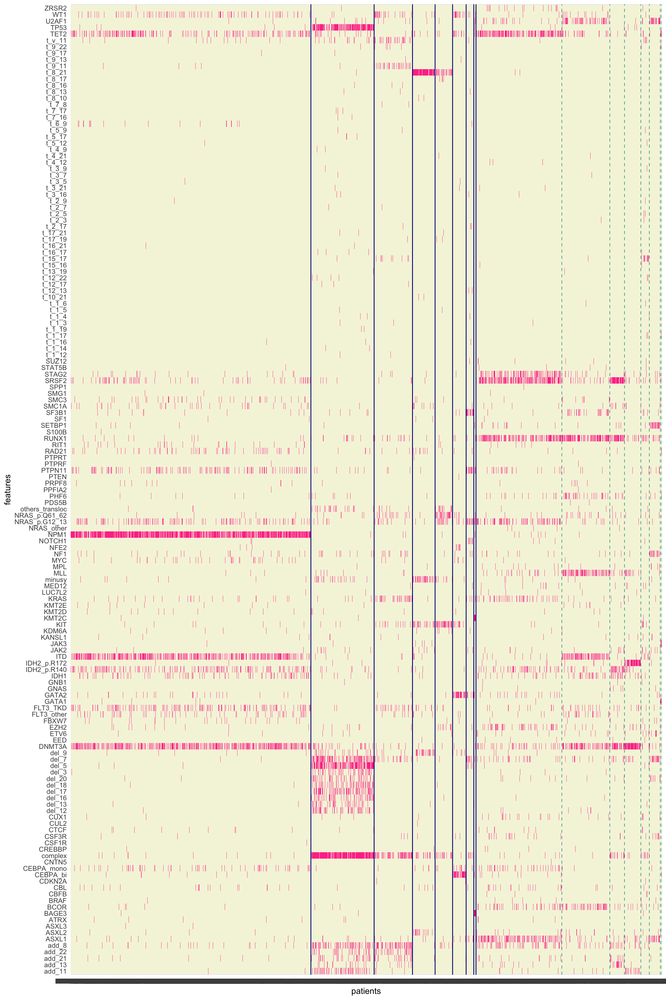

In [8]:
options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_all_components$predicted_component)   ## to separate by component
# plot the heatmap
ggplot(melt.data_all, aes(variable,features)) +
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c('0' = 'beige', '1' = 'violetred1')) +
geom_vline(xintercept = cumsum(col_sep)[1:8] + 0.5, col = 'darkblue', linetype = 1, size = 0.5) +
geom_vline(xintercept = cumsum(col_sep)[9:15] + 0.5, col = 'cyan4', linetype = 2, size = 0.3) +
labs(x = 'patients') 

In [9]:
table(df_all_components['predicted_component'])


  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15 
851 224 136  80  62  48  27   8 304 170  52  58  30  39   5 